In [1]:
%load_ext autoreload 
%autoreload 2
import cv2
import json, os, cv2
from pathlib import Path
import pandas as pd 
import matplotlib.pyplot as plt 
import numpy as np
import xarray as xr
import seaborn as sns
import h5py as hf
from tqdm import tqdm
from tqdm import tqdm
import itertools 
from scipy.interpolate import interp1d
from scipy.interpolate import splev, splrep
from scipy import signal
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.cluster import KMeans
import matplotlib.colors as mcolors
import os, fnmatch
from scipy.spatial.distance import cdist
from scipy.ndimage import gaussian_filter1d
from scipy.stats import linregress
import ast

import sys
sys.path.insert(0, 'C:/Users/nlab/Documents/GitHub/obstacle_avoidance')
#sys.path.append(r'C:\Users\nlab\Documents\GitHub\obstacle_avoidance\plots') # go to parent dir 

from utils.base_functions import *
from src.utils.auxiliary import flatten_series
from src.utils.path import find
from src.base import BaseInput
from plots.plots import plot_oa
from plots.plots2 import *
#from plots.plots import *
import warnings
warnings.filterwarnings('ignore')

<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
c:\Users\nlab\anaconda3\envs\ephys0\lib\site-packages\deeplabcut\__init__.py:78: UserWarning: 
        As PyTorch is not installed, unsupervised identity learning will not be available.
        Please run `pip install torch`, or ignore this warning.
        
  warnings.warn(


In [2]:
oa_session = plot_oa(r"D:\obstacle_avoidance\metadata\compiled_data\G8CK1_G8CK_light.json",'blank')
oa_session.gather_session_df('obstacle',6)
oa_df = oa_session.df

6


In [3]:
dark_oa_session = plot_oa(r"D:\obstacle_avoidance\metadata\compiled_data\G8CK1_G8CK_dark.json",'blank')
dark_oa_session.gather_session_df('obstacle',6)
dark_oa_df = dark_oa_session.df

6


In [4]:
calculate_relative_distance_goal_ts(oa_df)

calculate_relative_distance_goal(oa_df)

calculate_relative_distance(oa_df)

ts_calculate_relative_distance(oa_df)

angle_to_open_corner(oa_df)

ts_angle_to_open_corner(oa_df)

angle_to_target_port(oa_df)

ts_angle_to_target_port(oa_df)

zero_out_angle(oa_df)

zero_out_angle_target_port(oa_df)

df_tortuosity(oa_df)

lateral_error_open_corner(oa_df)

find_consective_trials(oa_df)

calculate_speed(oa_df)

head_body_angle(oa_df)

deveation(oa_df)

goal_and_obstacle_tortuosity(oa_df)

In [5]:
calculate_relative_distance_goal_ts(dark_oa_df)

calculate_relative_distance_goal(dark_oa_df)

calculate_relative_distance(dark_oa_df)

ts_calculate_relative_distance(dark_oa_df)

angle_to_open_corner(dark_oa_df)

ts_angle_to_open_corner(dark_oa_df)

angle_to_target_port(dark_oa_df)

ts_angle_to_target_port(dark_oa_df)

zero_out_angle(dark_oa_df)

zero_out_angle_target_port(dark_oa_df)

df_tortuosity(dark_oa_df)

lateral_error_open_corner(dark_oa_df)

find_consective_trials(dark_oa_df)

calculate_speed(dark_oa_df)

head_body_angle(dark_oa_df)
deveation(dark_oa_df)
goal_and_obstacle_tortuosity(dark_oa_df)

In [367]:

lateral_error_open_corner(dark_oa_df)

In [96]:
goal_and_obstacle_tortuosity(dark_oa_df)

In [7]:
G8CK = [i for i in oa_df.animal.unique().tolist() if '1' not in i]
G8CK1 = [i for i in oa_df.animal.unique().tolist() if '1'  in i]

G8CK_naive = ['042823','043023','050123']


G8CK_early = [ '050223','050323','050423']

G8CK_middle = ['050523','050923','051023']

G8CK_late = ['071823',  '071923', '072123','061323', '061423']

G8CK1_naive = ['051723','051823','051923']

G8CK1_early = ['052223', '052323', '052523',]

G8CK1_middle = ['052623','061323', '061423',]

G8CK1_late = [   '071823','071923', '072123']

df = oa_df

for ind, row in df.iterrows():
    if row.animal in G8CK:
        if row.date in G8CK_naive:
            df.at[ind,'skill'] = 'naive'
        if row.date in G8CK_early:
            df.at[ind,'skill'] = 'early'
        if row.date in G8CK_middle:
            df.at[ind,'skill'] = 'middle'
        if row.date in G8CK_late:
            df.at[ind,'skill'] = 'late'

            
    elif row.animal in G8CK1:
        if row.date in G8CK1_naive:
            df.at[ind,'skill'] = 'naive'
        if row.date in G8CK1_early:
            df.at[ind,'skill'] = 'early'
        if row.date in G8CK1_middle:
            df.at[ind,'skill'] = 'middle'
        if row.date in G8CK1_late:
            df.at[ind,'skill'] = 'late'




In [8]:
ns_oa_long,ns_oa_short,ns_oa_middle = create_df_by_type_nostart(oa_df)
ns_dark_long,ns_dark_short,ns_dark_middle =create_df_by_type_nostart(dark_oa_df)

oa_long,oa_short,oa_middle = create_df_by_type(oa_df)
dark_long,dark_short,dark_middle =create_df_by_type(dark_oa_df)

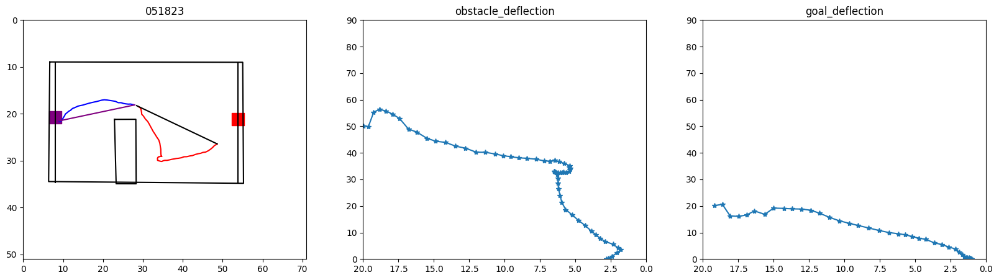

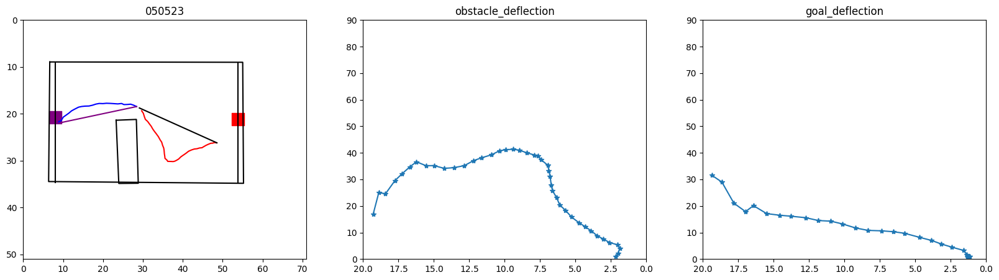

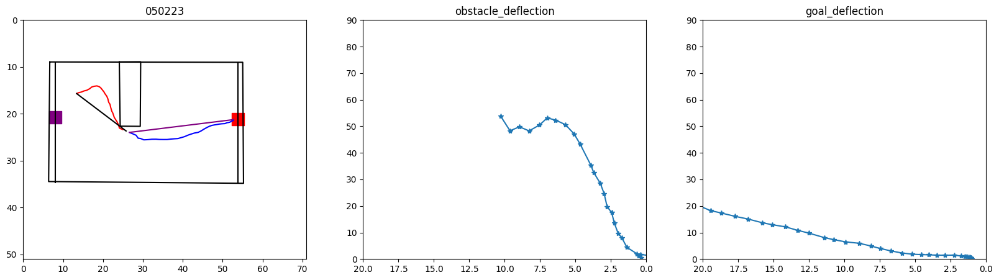

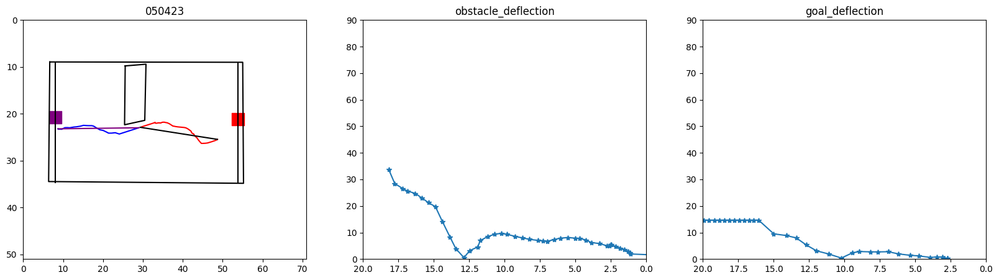

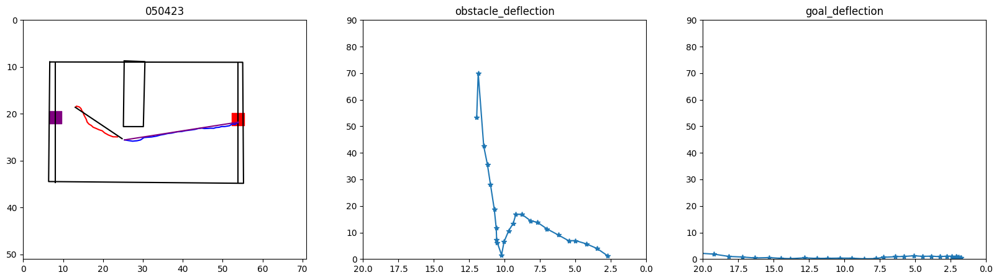

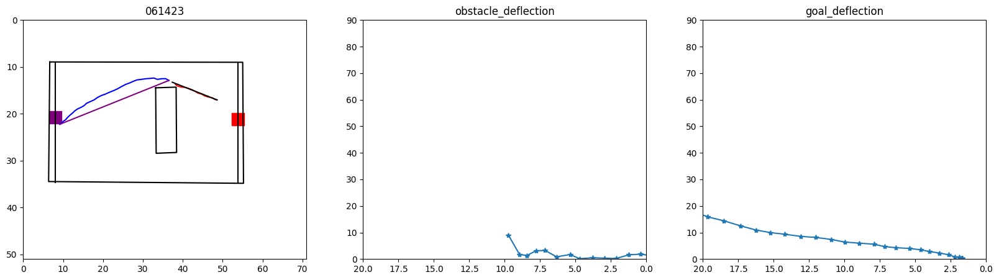

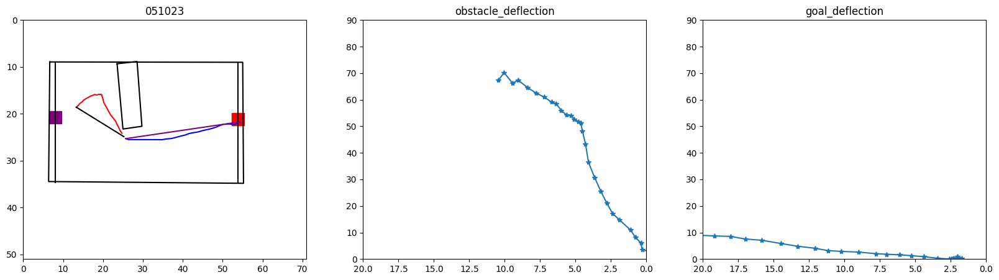

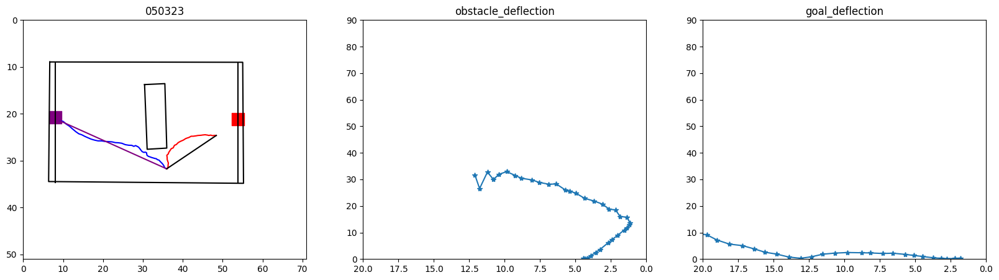

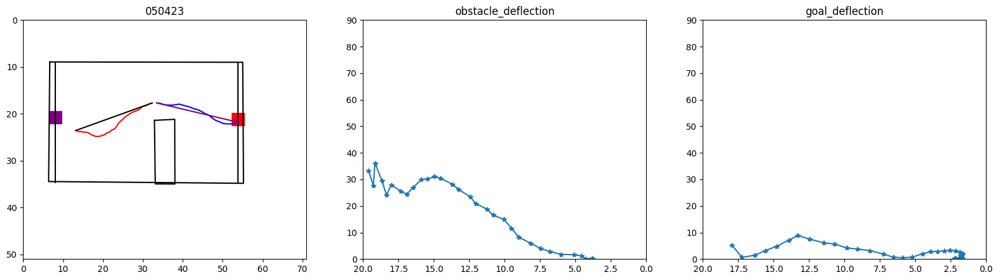

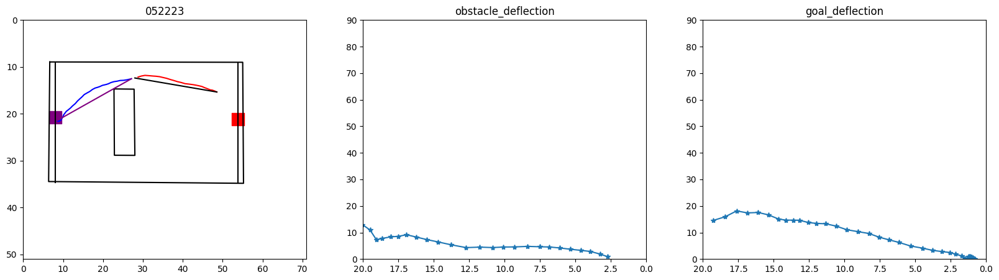

In [52]:
test_dark = oa_df.sample(10)
for ind,row in test_dark.iterrows():
    fig,ax = plt.subplots(1,3,figsize=(20,5))
    trial_df = test_dark.loc[[ind]]
    plot_arena_single(trial_df,ax[0])
    plot_orginal_obstacle(trial_df,ax[0],int(row.obstacle_cluster))



    #ax[0].set_title()
    ax[0].set_title(row.date)
    ax[1].set_title('obstacle_deflection')
    ax[2].set_title('goal_deflection')

    obstacle_ind = int(row.obstacle_ind)
    goal_ind = int(row.goal_ind)
    ax[0].plot(row.goal_nose_x,row.goal_nose_y,color = 'blue')
    ax[0].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'red')

    obstacle_basis_start_x, obstacle_basis_start_y = row.ts_nose_x_cm[0],row.ts_nose_y_cm[0]
    obstacle_basis_end_x, obstacle_basis_end_y = row.ts_nose_x_cm[obstacle_ind],row.ts_nose_y_cm[obstacle_ind]
    obstacle_basis_vector = calculate_vector_between_points((obstacle_basis_start_x,obstacle_basis_start_y),(obstacle_basis_end_x,obstacle_basis_end_y))
    obstacle_nose_x,obstacle_nose_y = row.ts_nose_x_cm[:obstacle_ind],row.ts_nose_y_cm[:obstacle_ind]
    ax[0].plot((row.obstacle_basis_start_x,row.obstacle_basis_end_x),(row.obstacle_basis_start_y,row.obstacle_basis_end_y), c = 'black')

    goal_basis_start_x, goal_basis_start_y = row.ts_nose_x_cm[goal_ind],row.ts_nose_y_cm[goal_ind]
    goal_basis_end_x, goal_basis_end_y = row.ts_nose_x_cm[-1],row.ts_nose_y_cm[-1]
    goal_basis_vector = calculate_vector_between_points((goal_basis_start_x,goal_basis_start_y),(goal_basis_end_x,goal_basis_end_y))
    goal_nose_x,goal_nose_y = row.ts_nose_x_cm[goal_ind:],row.ts_nose_y_cm[goal_ind:]
    ax[0].plot((row.goal_basis_start_x,row.goal_basis_end_x),(row.goal_basis_start_y,row.goal_basis_end_y), c = 'purple')

    
    obstacle_devations = []
    for i in list(range(len(obstacle_nose_x))):
        obstacle_nose_vector = calculate_vector_between_points((obstacle_basis_start_x,obstacle_basis_start_y),(obstacle_nose_x[i],obstacle_nose_y[i]))
        _,dev = angle_between_vectors(obstacle_nose_vector,obstacle_basis_vector)
        #devations.append(dev) 
        #dev = calculate_angle((nose_x[i],nose_y[i]),(origin_x,origin_y),(end_x,end_y))
        obstacle_devations.append(dev)
    ax[1].plot(row.ts_distance_from_edge[:obstacle_ind],obstacle_devations,'-*')
    ax[1].set_xlim(0,20)
    ax[1].invert_xaxis()
    ax[1].set_ylim(0,90)
    


    goal_devations = []
    for i in list(range(len(goal_nose_x))):
        goal_nose_vector = calculate_vector_between_points((goal_basis_start_x,goal_basis_start_y),(goal_nose_x[i],goal_nose_y[i]))
        _,dev = angle_between_vectors(goal_nose_vector,goal_basis_vector)
        #devations.append(dev) 
        #dev = calculate_angle((nose_x[i],nose_y[i]),(origin_x,origin_y),(end_x,end_y))
        goal_devations.append(dev)
    ax[2].plot(row.ts_distance_from_target_port[goal_ind:],goal_devations,'-*')
    ax[2].set_xlim(0,20)
    ax[2].invert_xaxis()
    ax[2].set_ylim(0,90)

In [58]:
[i for i in oa_long.animal.unique().tolist() if '1' not in i]

['G8CKRT', 'G8CKLT', 'G8CKTT', 'G8CKRN', 'G8CKLN']

In [66]:
oa_df

,level_0,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,rightear_x,...,goal_basis_start_x,goal_basis_start_y,goal_basis_end_x,goal_basis_end_y,obstacle_devations,goal_devations,ob_tortuosity,ob_linearity,go_tortuosity,go_linearity
0,1,55849.980608,55854.351193,"[55849.982899, 55850.000243, 55850.016243, 558...","[[618, 619, 620, 621, 622, 623, 624, 625, 626,...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[678.4732055664062, 678.5654907226562, 679.592...","[263.2254638671875, 264.38568115234375, 265.22...","[670.2373046875, 670.263916015625, 670.7482910...",...,35.933897,30.201287,9.335719,22.847456,"[nan, 51.114591181008294, 37.67418889302829, 4...","[nan, 15.285487260042073, 15.285487260041805, ...",1.932238,0.517534,1.026337,0.974339
1,3,55856.703040,55863.809664,"[55856.718592, 55856.735385, 55856.752588, 558...","[[1022, 1023, 1024, 1025, 1026, 1027, 1028, 10...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[681.59326171875, 682.0374755859375, 682.17260...","[261.0768127441406, 261.3218078613281, 261.290...","[671.5408325195312, 672.2661743164062, 672.129...",...,28.380083,10.908478,7.514455,21.506457,"[nan, 92.04995541165721, 94.71591839890075, 10...","[nan, 32.87943828195899, 23.088402630636132, 2...",1.175810,0.850477,1.524846,0.655804
2,5,55873.899059,55878.777804,"[55873.907904, 55873.92471, 55873.941286, 5587...","[[2053, 2054, 2055, 2056, 2057, 2058, 2059, 20...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[676.9694213867188, 677.7153930664062, 678.769...","[262.11907958984375, 262.3038330078125, 263.46...","[670.2584838867188, 671.1596069335938, 672.537...",...,35.524117,13.539736,7.612872,21.450060,"[nan, 29.617151025126613, 26.423703168634862, ...","[nan, 33.037896841309546, 31.78300658857247, 3...",1.027763,0.972987,1.114535,0.897236
3,7,55884.844595,55888.674624,"[55884.845299, 55884.861926, 55884.879436, 558...","[[2709, 2710, 2711, 2712, 2713, 2714, 2715, 27...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[677.1893310546875, 678.1749877929688, 679.715...","[259.8717346191406, 261.8793640136719, 263.211...","[668.1810302734375, 669.8963623046875, 671.902...",...,35.493858,14.665506,7.675873,21.541779,"[nan, 41.55006132518092, 35.024159698623066, 2...","[nan, 47.018390341399176, 44.07934103761527, 4...",1.293056,0.773362,1.140702,0.876653
4,8,55888.674624,55892.103206,"[55888.68014, 55888.696358, 55888.713036, 5588...","[2939, 2940, 2941, 2942, 2943, 2944, 2945, 294...","[98.96044158935547, 98.02863311767578, 98.9829...","[278.30615234375, 278.5882568359375, 278.59121...","[117.44532012939453, 116.13001251220703, 115.6...","[265.80596923828125, 266.5619812011719, 267.55...","[106.43080139160156, 104.86589813232422, 104.9...",...,24.007815,11.332143,52.416114,19.064634,"[nan, 45.64398872715979, 61.00508497268069, 68...","[nan, 26.934894078552503, 26.93489407855256, 2...",2.706519,0.369478,1.035622,0.965604
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11378,110,54888.085900,54890.908224,"[54888.086464, 54888.103206, 54888.119872, 548...","[[22822, 22823, 22824, 22825, 22826, 22827, 22...","[674.3788452148438, 675.014404296875, 675.4620...","[265.06536865234375, 266.0350646972656, 266.01...","[660.0407104492188, 661.0252685546875, 661.607...","[257.75115966796875, 257.29388427734375, 256.4...","[665.1829223632812, 666.2193603515625, 666.780...",...,31.767601,27.139663,7.099430,19.237850,"[nan, 36.308048108116644, 23.923798658819567, ...","[nan, 35.40962085239371, 30.59765098866344, 27...",NaN,NaN,1.075974,0.929390
11379,111,54898.765068,54900.424089,"[54898.773568, 54898.790272, 54898.807001, 548...","[[23463, 23464, 23465, 23466, 23467, 23468, 23...","[674.2321166992188, 674.8368530273438,

In [71]:
[i for i in oa_long.animal.unique().tolist() if '1' not in i]

['G8CKRT', 'G8CKLT', 'G8CKTT', 'G8CKRN', 'G8CKLN']

In [235]:
data = oa_long[oa_long["animal"].isin([i for i in oa_long.animal.unique().tolist() if '1' in i])]

In [236]:
data.date.unique()

array(['051723', '051823', '051923', '052223', '052323', '052523',
       '052623', '061323', '061423', '071823', '071923', '072123'],
      dtype=object)

In [237]:
data = oa_long[oa_long["animal"].isin([i for i in oa_long.animal.unique().tolist() if '1' not in i])]
data.date.unique()

array(['042823', '043023', '050123', '050223', '050323', '050423',
       '050523', '050923', '051023', '061323', '061423', '071823',
       '071923', '072123'], dtype=object)

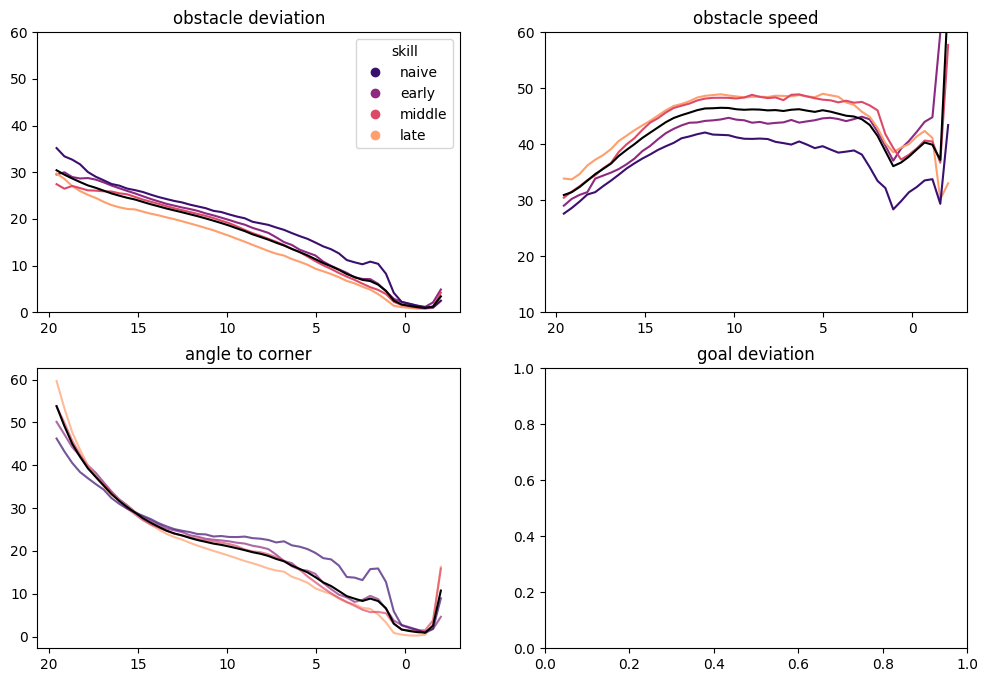

In [276]:
#data = pd.concat([oa_long,oa_short])
data = ns_oa_long

data = drop_nans_in_columns(data,'obstacle_devations')
#oa_long[oa_long['animal']!=[i for i in oa_long.animal.unique().tolist() if '1' not in i]]
xnew =  np.arange(-2, 20, .44)
fig,ax = plt.subplots(2,2,figsize=(12,8))
color_map = create_color_dict(data,'skill','magma',sort=False)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
ax[0,0].set_title('obstacle deviation')
ax[0,0].invert_xaxis()
ax[0,0].set_ylim(0,60)
ax[0,0].legend(markers, color_map.keys(), numpoints=1,title = 'skill')

ax[0,1].set_title('obstacle speed')
ax[0,1].invert_xaxis()
ax[0,1].set_ylim(10,60)


ax[1,0].set_title('angle to corner')
ax[1,0].invert_xaxis()
ax[1,1].set_title('goal deviation')





by_date = data.groupby(['skill'])
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    dev_array = np.empty([rows,50])
    dev_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        dev_array[i] = ynew

    date_dev = np.nanmean(dev_array,axis = 0)
    ax[0,0].plot(xnew,date_dev,c = color,alpha = 1)

rows = data.shape[0]
dev_array = np.empty([rows,50])
dev_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    dev_array[i] = ynew

all_dev = np.nanmean(dev_array,axis = 0)
ax[0,0].plot(xnew,all_dev,c = 'black')
std_error_dev = np.nanstd(all_dev,axis=0)
#ax[0,0].fill_between(xnew, 
#all_dev-std_error_dev, 
#all_dev+std_error_dev, 
#facecolor='blue', alpha=0.5)


for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    speed_array = np.empty([rows,50])
    speed_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        speed_array[i] = ynew

    date_speed = np.nanmean(speed_array,axis = 0)
    ax[0,1].plot(xnew,date_speed,c = color,alpha = 1)

rows = data.shape[0]
speed_array = np.empty([rows,50])
speed_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    speed_array[i] = ynew
all_speed = np.nanmean(speed_array,axis = 0)
ax[0,1].plot(xnew,all_speed,c = 'black')

for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,0].plot(xnew,date_angle,c = color,alpha = .7)

rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    angle_array[i] = ynew
all_angle = np.nanmean(angle_array,axis = 0)
ax[1,0].plot(xnew,all_angle,c = 'black')

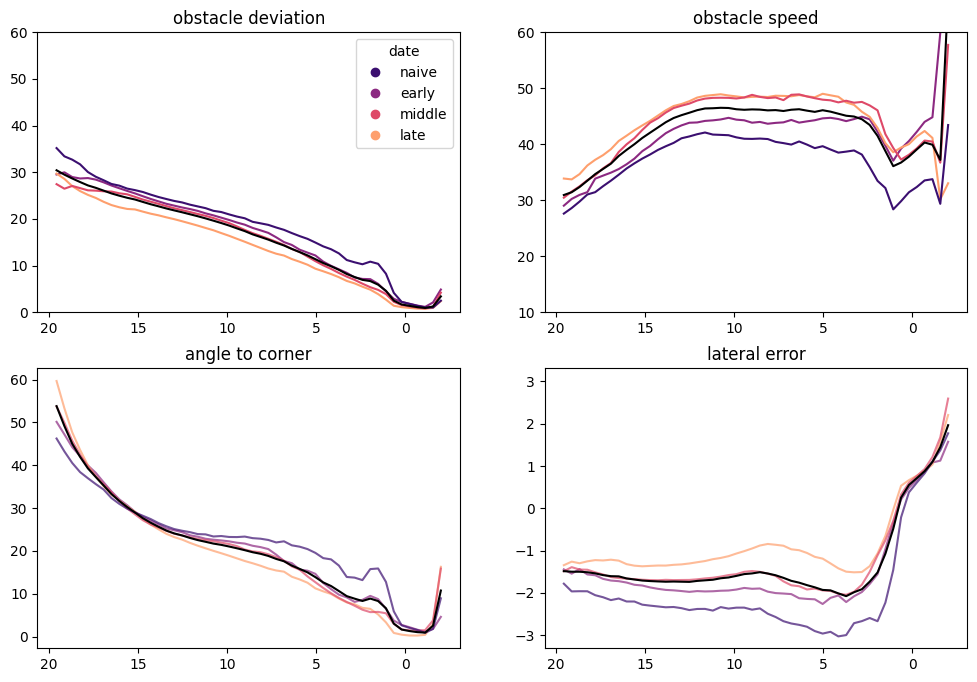

In [373]:
#data = pd.concat([dark_long,dark_short])
data =ns_oa_long

data = drop_nans_in_columns(data,'obstacle_devations')
#oa_long[oa_long['animal']!=[i for i in oa_long.animal.unique().tolist() if '1' not in i]]
xnew =  np.arange(-2, 20, .44)
fig,ax = plt.subplots(2,2,figsize=(12,8))
color_map = create_color_dict(data,'skill','magma',sort=False)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
ax[0,0].set_title('obstacle deviation')
ax[0,0].invert_xaxis()
ax[0,0].set_ylim(0,60)
ax[0,0].legend(markers, color_map.keys(), numpoints=1,title = 'date')

ax[0,1].set_title('obstacle speed')
ax[0,1].invert_xaxis()
ax[0,1].set_ylim(10,60)


ax[1,0].set_title('angle to corner')
ax[1,0].invert_xaxis()
ax[1,1].set_title('lateral error')
ax[1,1].invert_xaxis()






by_date = data.groupby(['skill'])
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    dev_array = np.empty([rows,50])
    dev_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        dev_array[i] = ynew

    date_dev = np.nanmean(dev_array,axis = 0)
    ax[0,0].plot(xnew,date_dev,c = color,alpha = 1)

rows = data.shape[0]
dev_array = np.empty([rows,50])
dev_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    dev_array[i] = ynew

all_dev = np.nanmean(dev_array,axis = 0)
ax[0,0].plot(xnew,all_dev,c = 'black')
std_error_dev = np.nanstd(all_dev,axis=0)
#ax[0,0].fill_between(xnew, 
#all_dev-std_error_dev, 
#all_dev+std_error_dev, 
#facecolor='blue', alpha=0.5)


for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    speed_array = np.empty([rows,50])
    speed_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        speed_array[i] = ynew

    date_speed = np.nanmean(speed_array,axis = 0)
    ax[0,1].plot(xnew,date_speed,c = color,alpha = 1)

rows = data.shape[0]
speed_array = np.empty([rows,50])
speed_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    speed_array[i] = ynew
all_speed = np.nanmean(speed_array,axis = 0)
ax[0,1].plot(xnew,all_speed,c = 'black')

for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,0].plot(xnew,date_angle,c = color,alpha = .7)

rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    angle_array[i] = ynew
all_angle = np.nanmean(angle_array,axis = 0)
ax[1,0].plot(xnew,all_angle,c = 'black')
#goal 
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,1].plot(xnew,date_angle,c = color,alpha = .7)

rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    angle_array[i] = ynew
all_angle = np.nanmean(angle_array,axis = 0)
ax[1,1].plot(xnew,all_angle,c = 'black')
symmetrize_y_axis(ax[1,1])

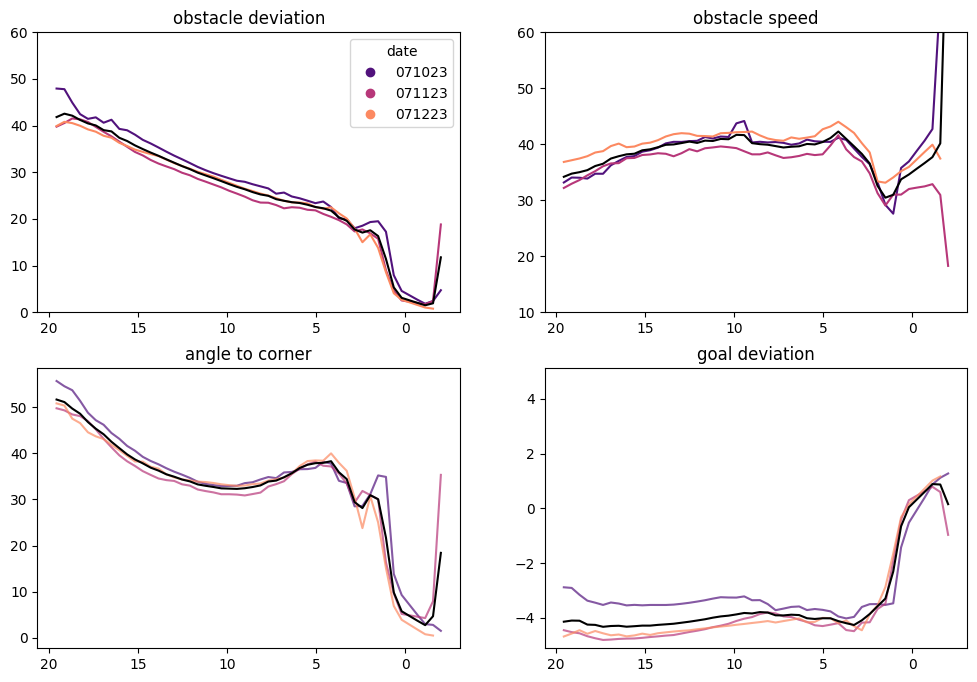

In [376]:
#data = pd.concat([dark_long,dark_short])
data =dark_long
data = drop_nans_in_columns(data,'obstacle_devations')

#data = drop_nans_in_columns(data,'skill')
#oa_long[oa_long['animal']!=[i for i in oa_long.animal.unique().tolist() if '1' not in i]]
xnew =  np.arange(-2, 20, .44)
fig,ax = plt.subplots(2,2,figsize=(12,8))
color_map = create_color_dict(data,'date','magma',sort=True)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
ax[0,0].set_title('obstacle deviation')
ax[0,0].invert_xaxis()
ax[0,0].set_ylim(0,60)
ax[0,0].legend(markers, color_map.keys(), numpoints=1,title = 'date')

ax[0,1].set_title('obstacle speed')
ax[0,1].invert_xaxis()
ax[0,1].set_ylim(10,60)


ax[1,0].set_title('angle to corner')
ax[1,0].invert_xaxis()
ax[1,1].set_title('goal deviation')
ax[1,1].invert_xaxis()





by_date = data.groupby(['date'])
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    dev_array = np.empty([rows,50])
    dev_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        dev_array[i] = ynew

    date_dev = np.nanmean(dev_array,axis = 0)
    ax[0,0].plot(xnew,date_dev,c = color,alpha = 1)

rows = data.shape[0]
dev_array = np.empty([rows,50])
dev_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    dev_array[i] = ynew

all_dev = np.nanmean(dev_array,axis = 0)
ax[0,0].plot(xnew,all_dev,c = 'black')
std_error_dev = np.nanstd(all_dev,axis=0)
#ax[0,0].fill_between(xnew, 
#all_dev-std_error_dev, 
#all_dev+std_error_dev, 
#facecolor='blue', alpha=0.5)


for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    speed_array = np.empty([rows,50])
    speed_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        speed_array[i] = ynew

    date_speed = np.nanmean(speed_array,axis = 0)
    ax[0,1].plot(xnew,date_speed,c = color,alpha = 1)

rows = data.shape[0]
speed_array = np.empty([rows,50])
speed_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    speed_array[i] = ynew
all_speed = np.nanmean(speed_array,axis = 0)
ax[0,1].plot(xnew,all_speed,c = 'black')

for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,0].plot(xnew,date_angle,c = color,alpha = .7)

rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    angle_array[i] = ynew
all_angle = np.nanmean(angle_array,axis = 0)
ax[1,0].plot(xnew,all_angle,c = 'black')
#goal 
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,1].plot(xnew,date_angle,c = color,alpha = .7)

rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    angle_array[i] = ynew
all_angle = np.nanmean(angle_array,axis = 0)
ax[1,1].plot(xnew,all_angle,c = 'black')
symmetrize_y_axis(ax[1,1])

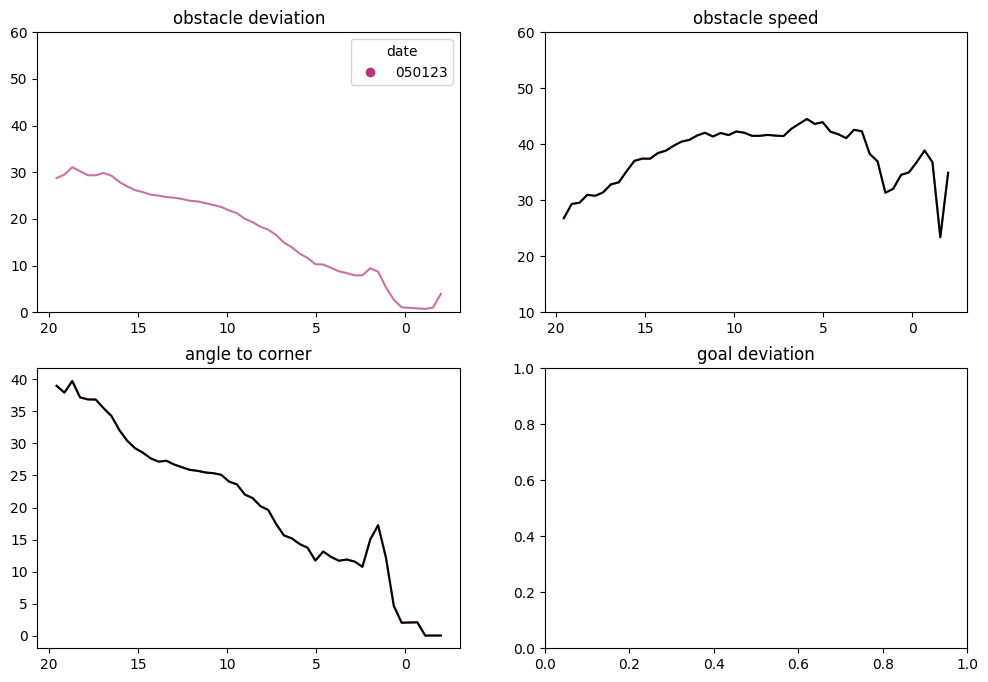

In [193]:
data = oa_long[oa_long["animal"].isin([i for i in oa_long.animal.unique().tolist() if '1'  not in i])]
data = data[data['date']== '050123']
#oa_long[oa_long['animal']!=[i for i in oa_long.animal.unique().tolist() if '1' not in i]]
xnew =  np.arange(-2, 20, .44)
fig,ax = plt.subplots(2,2,figsize=(12,8))
color_map = create_color_dict(data,'date','magma',sort=True)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
ax[0,0].set_title('obstacle deviation')
ax[0,0].invert_xaxis()
ax[0,0].set_ylim(0,60)
ax[0,0].legend(markers, color_map.keys(), numpoints=1,title = 'date')

ax[0,1].set_title('obstacle speed')
ax[0,1].invert_xaxis()
ax[0,1].set_ylim(10,60)


ax[1,0].set_title('angle to corner')
ax[1,0].invert_xaxis()
ax[1,1].set_title('goal deviation')





by_date = data.groupby(['date'])
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    dev_array = np.empty([rows,50])
    dev_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        dev_array[i] = ynew

    date_dev = np.nanmean(dev_array,axis = 0)
    ax[0,0].plot(xnew,date_dev,c = color,alpha = .7)

rows = data.shape[0]
dev_array = np.empty([rows,50])
dev_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    dev_array[i] = ynew

all_dev = np.nanmean(dev_array,axis = 0)
#ax[0,0].plot(xnew,all_dev,c = 'black')
std_error_dev = np.nanstd(all_dev,axis=0)
#ax[0,0].fill_between(xnew, 
#all_dev-std_error_dev, 
#all_dev+std_error_dev, 
#facecolor='blue', alpha=0.5)


for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    speed_array = np.empty([rows,50])
    speed_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        speed_array[i] = ynew

    date_speed = np.nanmean(speed_array,axis = 0)
    ax[0,1].plot(xnew,date_speed,c = color,alpha = .7)

rows = data.shape[0]
speed_array = np.empty([rows,50])
speed_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    speed_array[i] = ynew
all_speed = np.nanmean(speed_array,axis = 0)
ax[0,1].plot(xnew,all_speed,c = 'black')

for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,0].plot(xnew,date_angle,c = color,alpha = .7)

rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
for i,row in enumerate(data.iterrows()):
    interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
    #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
    ynew = interpolater(xnew)
    angle_array[i] = ynew
all_angle = np.nanmean(angle_array,axis = 0)
ax[1,0].plot(xnew,all_angle,c = 'black')

In [209]:
oa_long.animal.unique()

array(['G8CKRT', 'G8CKLT', 'G8CKTT', 'G8CKRN', 'G8CKLN', 'G8CK1RT',
       'G8CK1LT', 'G8CK1TT', 'G8CK1LN'], dtype=object)

In [ ]:
data = oa_long[oa_long["animal"].isin([i for i in ns_oa_long.animal.unique().tolist() if '1' in i])]
#data = oa_long
data = data[data['obstacle_cluster']==0]
#data = data[(data['date']== '050123')]
xnew =  np.arange(0, 20, .4)
by_date = data.groupby(['skill'])
for date,date_df in by_date:
    fig,ax = plt.subplots(2,3,figsize=(16,8))
    ax[0,0].set_title(str(date))
    ax[0,1].set_title('obstalce deveation ')
    ax[0,1].set_ylim(0,90)
    ax[0,1].invert_xaxis()
    ax[0,2].set_title('obstalce deveation mean')
    ax[0,2].set_ylim(0,90)
    ax[0,2].invert_xaxis()
    ax[1,0].set_title('goal deveation ')
    ax[1,0].set_ylim(0,90)
    ax[1,0].invert_xaxis()
    ax[1,1].set_ylim(0,90)
    ax[1,1].set_title('goal deveation mean')
    ax[1,1].set_ylim(0,90)
    ax[1,1].invert_xaxis()
    plot_arena(date_df,ax[0,0],obstacle=False)
    plot_orginal_obstacle(date_df,ax[0,0],cluster=0)

    
    for ind,row in date_df.iterrows():
        ax[0,0].plot(row.goal_nose_x,row.goal_nose_y,color = 'blue',alpha = .3)
        ax[0,0].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'red',alpha = .3)
        ax[0,0].plot((row.goal_basis_start_x,row.goal_basis_end_x),(row.goal_basis_start_y,row.goal_basis_end_y),color = 'black',alpha = .3)
        ax[0,0].plot((row.obstacle_basis_start_x,row.obstacle_basis_end_x),(row.obstacle_basis_start_y,row.obstacle_basis_end_y),color = 'purple',alpha = .3)
    rows = date_df.shape[0]
    obstalce_array = np.empty([rows,50])
    obstalce_array[:] =np.nan 
    

    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['obstacle_devations'])
        ynew = interpolater(xnew)
        obstalce_array[i] = ynew
        

        ax[0,2].plot(xnew,ynew,c = 'grey',alpha = .5)
        ax[0,1].plot(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['obstacle_devations'],c = 'black',alpha = .5)
    ax[0,2].plot(xnew,np.nanmean(obstalce_array,axis = 0),c = 'blue')
    std_error_obstacle = np.nanstd(obstalce_array,axis=0)
    ax[0,2].fill_between(xnew, 
    np.nanmean(obstalce_array,axis = 0)-std_error_obstacle, 
    np.nanmean(obstalce_array,axis = 0)+std_error_obstacle, 
    facecolor='blue', alpha=0.5)

    rows = date_df.shape[0]
    goal_array = np.empty([rows,50])
    goal_array[:] =np.nan 
    

    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):].astype(float),row[1]['goal_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):],row[1]['goal_devations'])
        ynew = interpolater(xnew)
        goal_array[i] = ynew
        

        ax[1,1].plot(xnew,ynew,c = 'grey',alpha = .5)
        ax[1,0].plot(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):],row[1]['goal_devations'],c = 'black',alpha = .5)
    ax[1,1].plot(xnew,np.nanmean(goal_array,axis = 0),c = 'blue')
    std_error_obstacle = np.nanstd(goal_array,axis=0)
    ax[1,1].fill_between(xnew, 
    np.nanmean(goal_array,axis = 0)-std_error_obstacle, 
    np.nanmean(goal_array,axis = 0)+std_error_obstacle, 
    facecolor='blue', alpha=0.5)

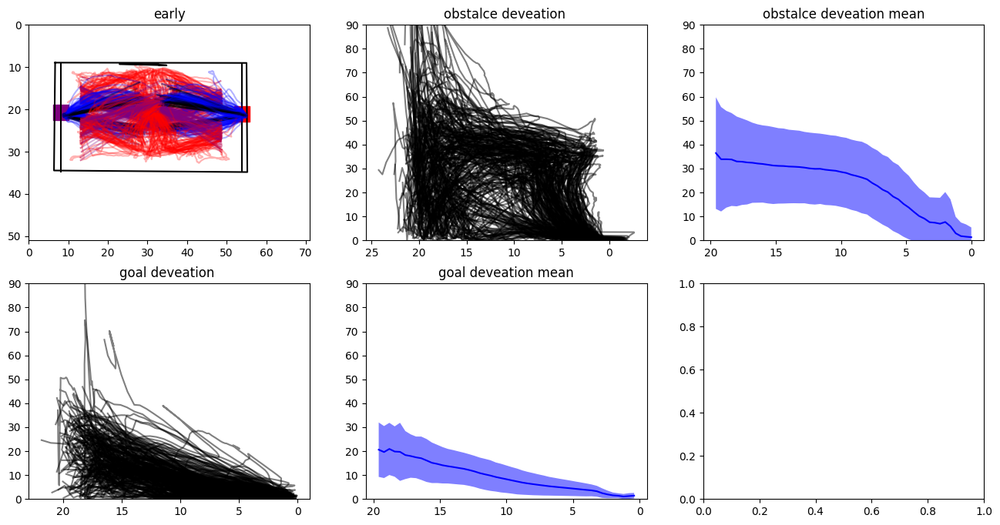

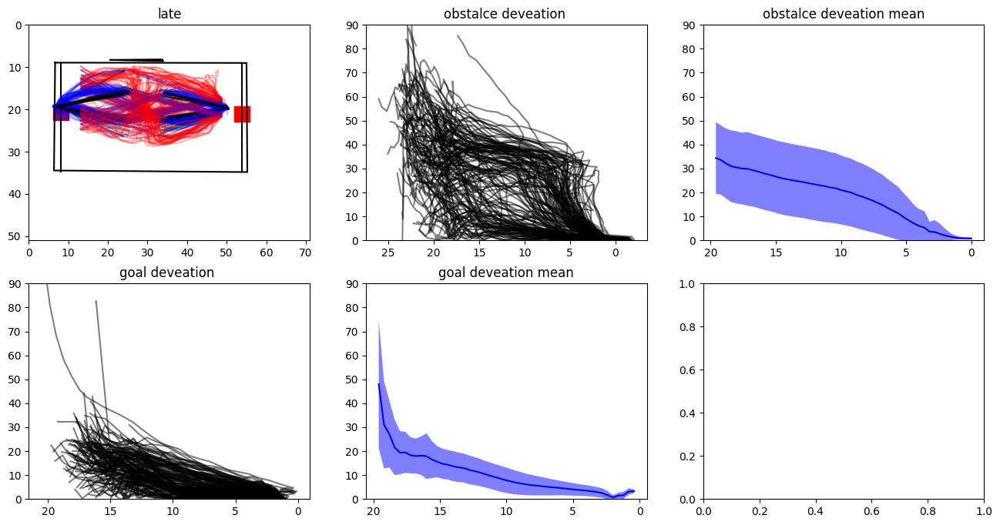

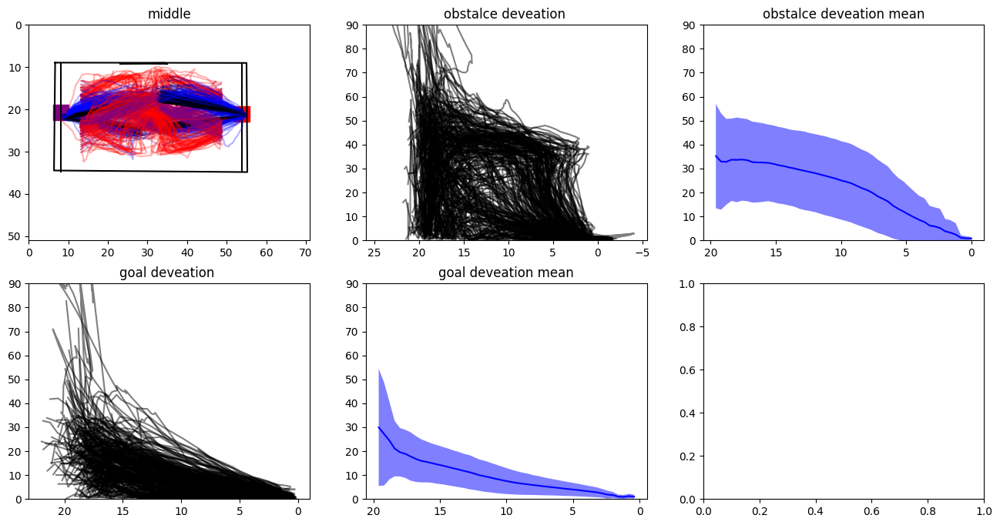

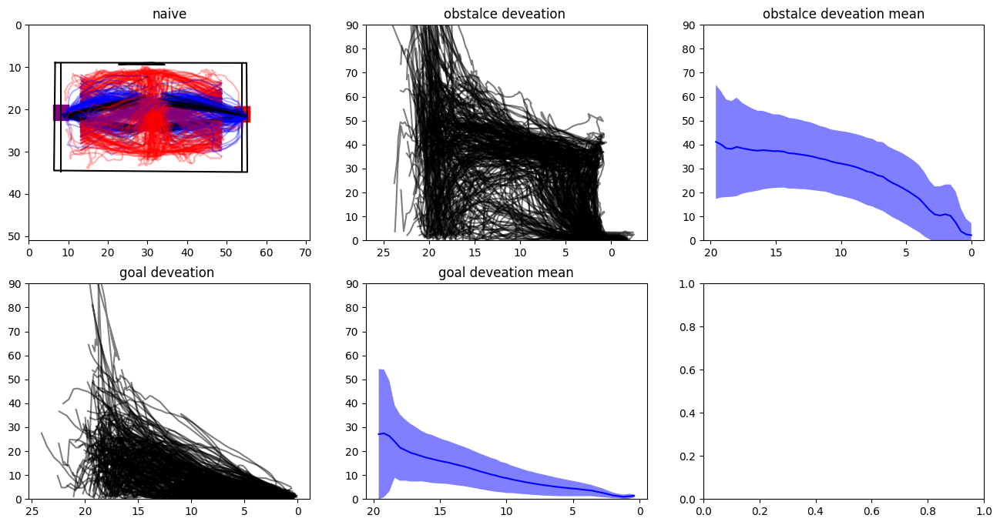

In [217]:
data = oa_long[oa_long["animal"].isin([i for i in ns_oa_long.animal.unique().tolist() if '1' in i])]
#data = oa_long
#data = data[data['obstacle_cluster']==0]
#data = data[(data['date']== '050123')]
xnew =  np.arange(0, 20, .4)
by_date = data.groupby(['skill'])
for date,date_df in by_date:
    fig,ax = plt.subplots(2,3,figsize=(16,8))
    ax[0,0].set_title(str(date))
    ax[0,1].set_title('obstalce deveation ')
    ax[0,1].set_ylim(0,90)
    ax[0,1].invert_xaxis()
    ax[0,2].set_title('obstalce deveation mean')
    ax[0,2].set_ylim(0,90)
    ax[0,2].invert_xaxis()
    ax[1,0].set_title('goal deveation ')
    ax[1,0].set_ylim(0,90)
    ax[1,0].invert_xaxis()
    ax[1,1].set_ylim(0,90)
    ax[1,1].set_title('goal deveation mean')
    ax[1,1].set_ylim(0,90)
    ax[1,1].invert_xaxis()
    plot_arena(date_df,ax[0,0],obstacle=False)
    plot_orginal_obstacle(date_df,ax[0,0],cluster=0)

    
    for ind,row in date_df.iterrows():
        ax[0,0].plot(row.goal_nose_x,row.goal_nose_y,color = 'blue',alpha = .3)
        ax[0,0].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'red',alpha = .3)
        ax[0,0].plot((row.goal_basis_start_x,row.goal_basis_end_x),(row.goal_basis_start_y,row.goal_basis_end_y),color = 'black',alpha = .3)
        ax[0,0].plot((row.obstacle_basis_start_x,row.obstacle_basis_end_x),(row.obstacle_basis_start_y,row.obstacle_basis_end_y),color = 'purple',alpha = .3)
    rows = date_df.shape[0]
    obstalce_array = np.empty([rows,50])
    obstalce_array[:] =np.nan 
    

    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['obstacle_devations'])
        ynew = interpolater(xnew)
        obstalce_array[i] = ynew
        

        #ax[0,2].plot(xnew,ynew,c = 'grey',alpha = .5)
        ax[0,1].plot(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['obstacle_devations'],c = 'black',alpha = .5)
    ax[0,2].plot(xnew,np.nanmean(obstalce_array,axis = 0),c = 'blue')
    std_error_obstacle = np.nanstd(obstalce_array,axis=0)
    ax[0,2].fill_between(xnew, 
    np.nanmean(obstalce_array,axis = 0)-std_error_obstacle, 
    np.nanmean(obstalce_array,axis = 0)+std_error_obstacle, 
    facecolor='blue', alpha=0.5)

    rows = date_df.shape[0]
    goal_array = np.empty([rows,50])
    goal_array[:] =np.nan 
    

    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):].astype(float),row[1]['goal_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):],row[1]['goal_devations'])
        ynew = interpolater(xnew)
        goal_array[i] = ynew
        

        #ax[1,1].plot(xnew,ynew,c = 'grey',alpha = .5)
        ax[1,0].plot(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):],row[1]['goal_devations'],c = 'black',alpha = .5)
    ax[1,1].plot(xnew,np.nanmean(goal_array,axis = 0),c = 'blue')
    std_error_obstacle = np.nanstd(goal_array,axis=0)
    ax[1,1].fill_between(xnew, 
    np.nanmean(goal_array,axis = 0)-std_error_obstacle, 
    np.nanmean(goal_array,axis = 0)+std_error_obstacle, 
    facecolor='blue', alpha=0.5)

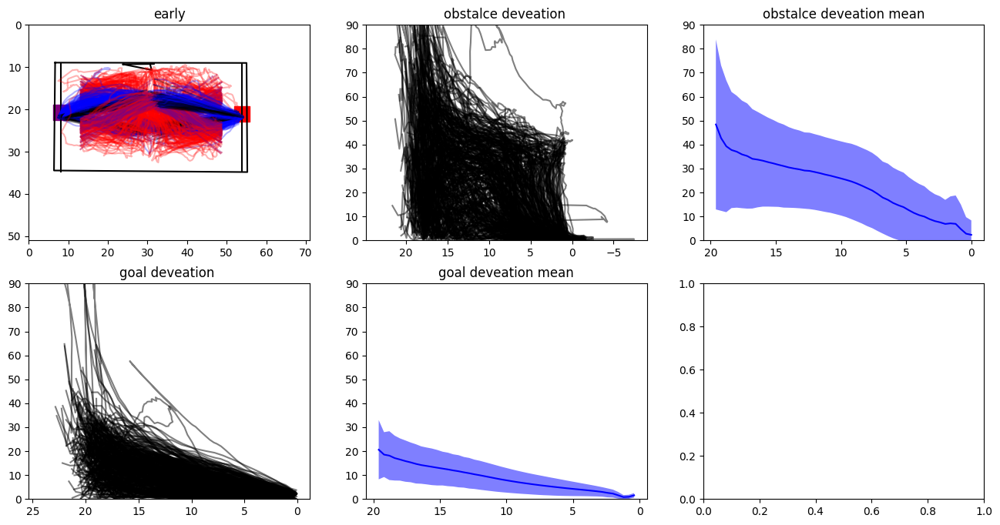

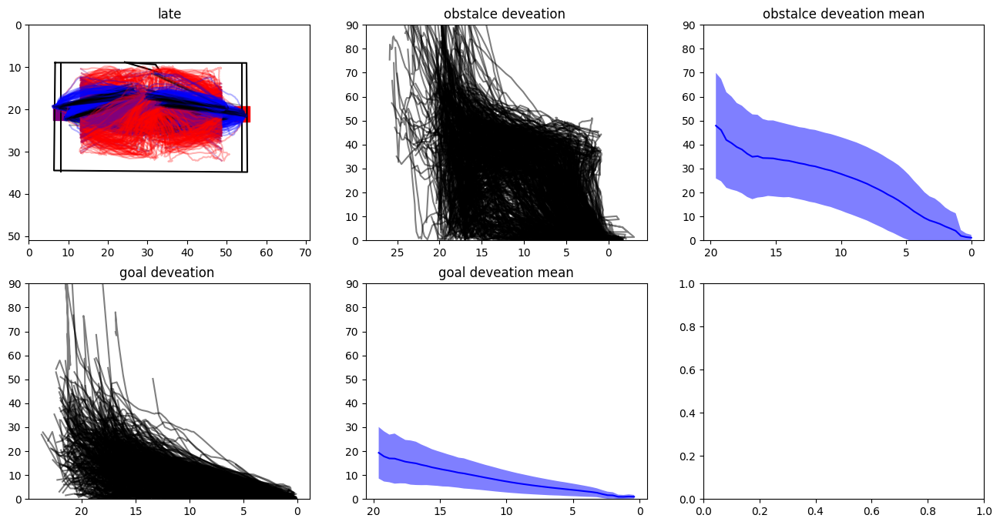

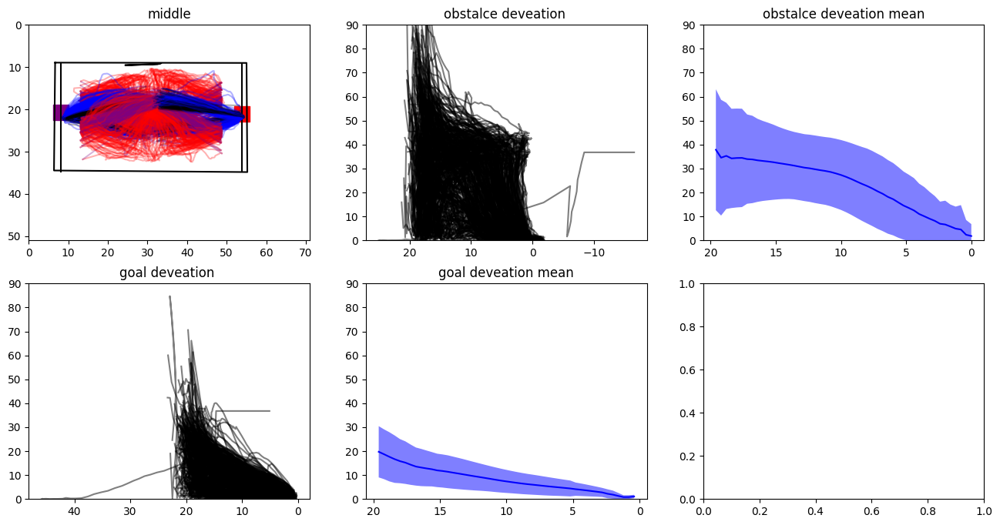

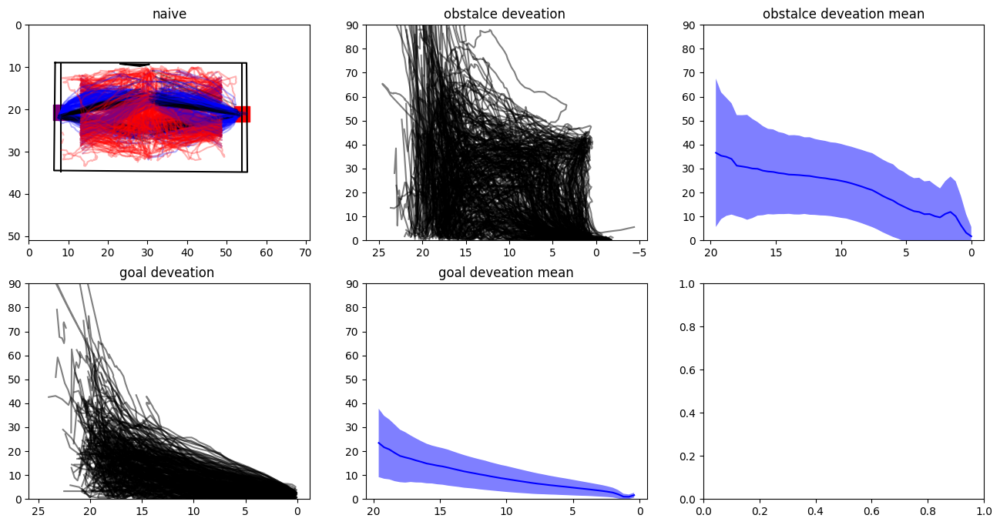

In [216]:
data = oa_long[oa_long["animal"].isin([i for i in ns_oa_long.animal.unique().tolist() if '1' not in i])]
#data = oa_long
#data = data[data['obstacle_cluster']==0]
#data = data[(data['date']== '050123')]
xnew =  np.arange(0, 20, .4)
by_date = data.groupby(['skill'])
for date,date_df in by_date:
    fig,ax = plt.subplots(2,3,figsize=(16,8))
    ax[0,0].set_title(str(date))
    ax[0,1].set_title('obstalce deveation ')
    ax[0,1].set_ylim(0,90)
    ax[0,1].invert_xaxis()
    ax[0,2].set_title('obstalce deveation mean')
    ax[0,2].set_ylim(0,90)
    ax[0,2].invert_xaxis()
    ax[1,0].set_title('goal deveation ')
    ax[1,0].set_ylim(0,90)
    ax[1,0].invert_xaxis()
    ax[1,1].set_ylim(0,90)
    ax[1,1].set_title('goal deveation mean')
    ax[1,1].set_ylim(0,90)
    ax[1,1].invert_xaxis()
    plot_arena(date_df,ax[0,0],obstacle=False)
    plot_orginal_obstacle(date_df,ax[0,0],cluster=0)

    
    for ind,row in date_df.iterrows():
        ax[0,0].plot(row.goal_nose_x,row.goal_nose_y,color = 'blue',alpha = .3)
        ax[0,0].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'red',alpha = .3)
        ax[0,0].plot((row.goal_basis_start_x,row.goal_basis_end_x),(row.goal_basis_start_y,row.goal_basis_end_y),color = 'black',alpha = .3)
        ax[0,0].plot((row.obstacle_basis_start_x,row.obstacle_basis_end_x),(row.obstacle_basis_start_y,row.obstacle_basis_end_y),color = 'purple',alpha = .3)
    rows = date_df.shape[0]
    obstalce_array = np.empty([rows,50])
    obstalce_array[:] =np.nan 
    

    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['obstacle_devations'])
        ynew = interpolater(xnew)
        obstalce_array[i] = ynew
        

        #ax[0,2].plot(xnew,ynew,c = 'grey',alpha = .5)
        ax[0,1].plot(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['obstacle_devations'],c = 'black',alpha = .5)
    ax[0,2].plot(xnew,np.nanmean(obstalce_array,axis = 0),c = 'blue')
    std_error_obstacle = np.nanstd(obstalce_array,axis=0)
    ax[0,2].fill_between(xnew, 
    np.nanmean(obstalce_array,axis = 0)-std_error_obstacle, 
    np.nanmean(obstalce_array,axis = 0)+std_error_obstacle, 
    facecolor='blue', alpha=0.5)

    rows = date_df.shape[0]
    goal_array = np.empty([rows,50])
    goal_array[:] =np.nan 
    

    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):].astype(float),row[1]['goal_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):],row[1]['goal_devations'])
        ynew = interpolater(xnew)
        goal_array[i] = ynew
        

        #ax[1,1].plot(xnew,ynew,c = 'grey',alpha = .5)
        ax[1,0].plot(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):],row[1]['goal_devations'],c = 'black',alpha = .5)
    ax[1,1].plot(xnew,np.nanmean(goal_array,axis = 0),c = 'blue')
    std_error_obstacle = np.nanstd(goal_array,axis=0)
    ax[1,1].fill_between(xnew, 
    np.nanmean(goal_array,axis = 0)-std_error_obstacle, 
    np.nanmean(goal_array,axis = 0)+std_error_obstacle, 
    facecolor='blue', alpha=0.5)

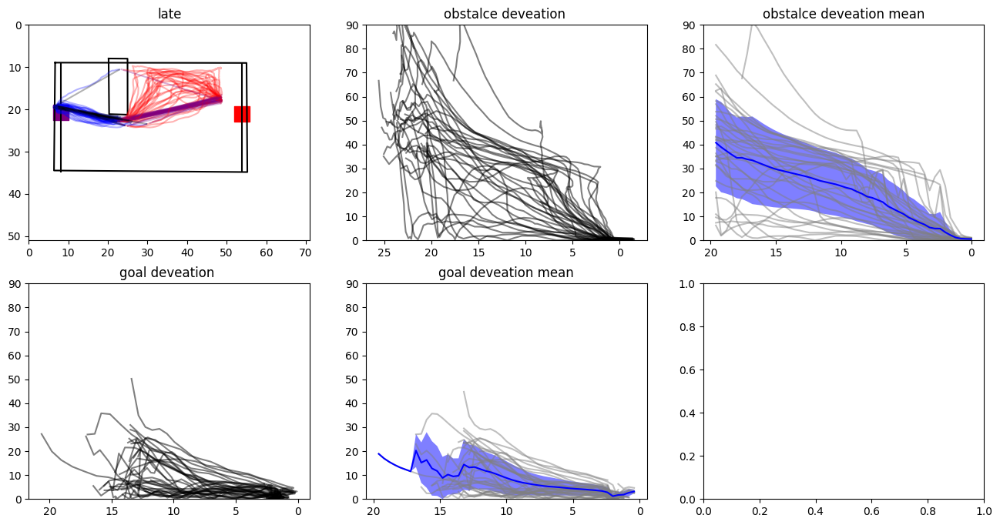

In [210]:
data = oa_long[oa_long["animal"].isin([i for i in ns_oa_long.animal.unique().tolist() if '1' not in i])]
data = oa_long
data = data[data['obstacle_cluster']==0]
data = data[(data['date']== '071323')]
xnew =  np.arange(0, 20, .4)
by_date = data.groupby(['skill'])
for date,date_df in by_date:
    fig,ax = plt.subplots(2,3,figsize=(16,8))
    ax[0,0].set_title(str(date))
    ax[0,1].set_title('obstalce deveation ')
    ax[0,1].set_ylim(0,90)
    ax[0,1].invert_xaxis()
    ax[0,2].set_title('obstalce deveation mean')
    ax[0,2].set_ylim(0,90)
    ax[0,2].invert_xaxis()
    ax[1,0].set_title('goal deveation ')
    ax[1,0].set_ylim(0,90)
    ax[1,0].invert_xaxis()
    ax[1,1].set_ylim(0,90)
    ax[1,1].set_title('goal deveation mean')
    ax[1,1].set_ylim(0,90)
    ax[1,1].invert_xaxis()
    plot_arena(date_df,ax[0,0],obstacle=False)
    plot_orginal_obstacle(date_df,ax[0,0],cluster=0)

    
    for ind,row in date_df.iterrows():
        ax[0,0].plot(row.goal_nose_x,row.goal_nose_y,color = 'blue',alpha = .3)
        ax[0,0].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'red',alpha = .3)
        ax[0,0].plot((row.goal_basis_start_x,row.goal_basis_end_x),(row.goal_basis_start_y,row.goal_basis_end_y),color = 'black',alpha = .3)
        ax[0,0].plot((row.obstacle_basis_start_x,row.obstacle_basis_end_x),(row.obstacle_basis_start_y,row.obstacle_basis_end_y),color = 'purple',alpha = .3)
    rows = date_df.shape[0]
    obstalce_array = np.empty([rows,50])
    obstalce_array[:] =np.nan 
    

    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['obstacle_devations'])
        ynew = interpolater(xnew)
        obstalce_array[i] = ynew
        

        ax[0,2].plot(xnew,ynew,c = 'grey',alpha = .5)
        ax[0,1].plot(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['obstacle_devations'],c = 'black',alpha = .5)
    ax[0,2].plot(xnew,np.nanmean(obstalce_array,axis = 0),c = 'blue')
    std_error_obstacle = np.nanstd(obstalce_array,axis=0)
    ax[0,2].fill_between(xnew, 
    np.nanmean(obstalce_array,axis = 0)-std_error_obstacle, 
    np.nanmean(obstalce_array,axis = 0)+std_error_obstacle, 
    facecolor='blue', alpha=0.5)

    rows = date_df.shape[0]
    goal_array = np.empty([rows,50])
    goal_array[:] =np.nan 
    

    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):].astype(float),row[1]['goal_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):],row[1]['goal_devations'])
        ynew = interpolater(xnew)
        goal_array[i] = ynew
        

        ax[1,1].plot(xnew,ynew,c = 'grey',alpha = .5)
        ax[1,0].plot(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):],row[1]['goal_devations'],c = 'black',alpha = .5)
    ax[1,1].plot(xnew,np.nanmean(goal_array,axis = 0),c = 'blue')
    std_error_obstacle = np.nanstd(goal_array,axis=0)
    ax[1,1].fill_between(xnew, 
    np.nanmean(goal_array,axis = 0)-std_error_obstacle, 
    np.nanmean(goal_array,axis = 0)+std_error_obstacle, 
    facecolor='blue', alpha=0.5)

In [176]:
data.date

17       042823
28       042823
39       042823
41       042823
54       042823
          ...  
11253    071423
11259    071423
11261    071423
11342    071423
11365    071423
Name: date, Length: 1593, dtype: object

In [174]:
data = oa_long[oa_long["animal"].isin([i for i in oa_long.animal.unique().tolist() if '1' not in i])]

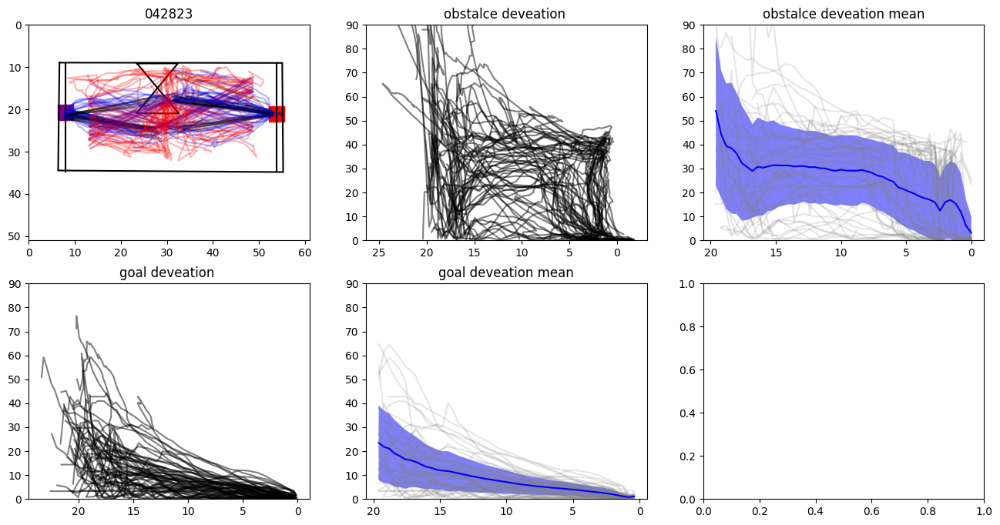

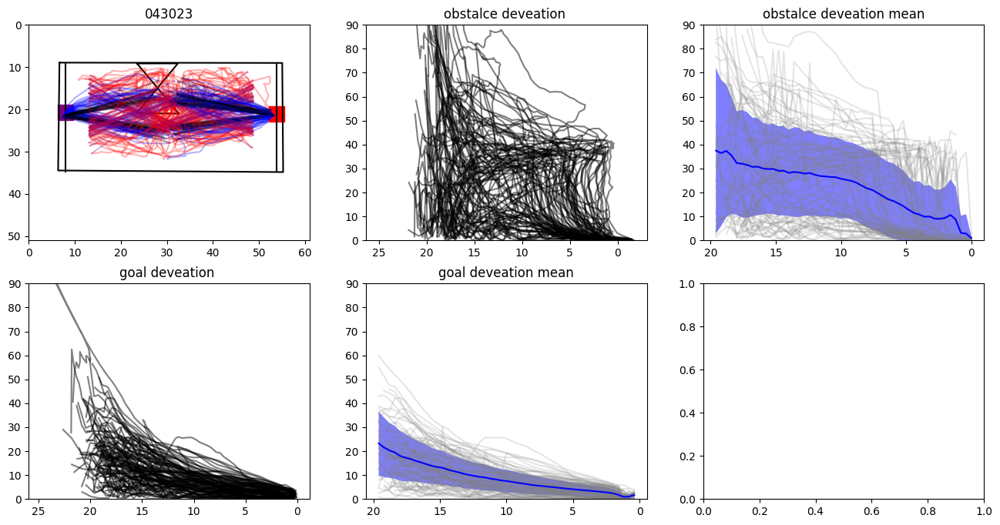

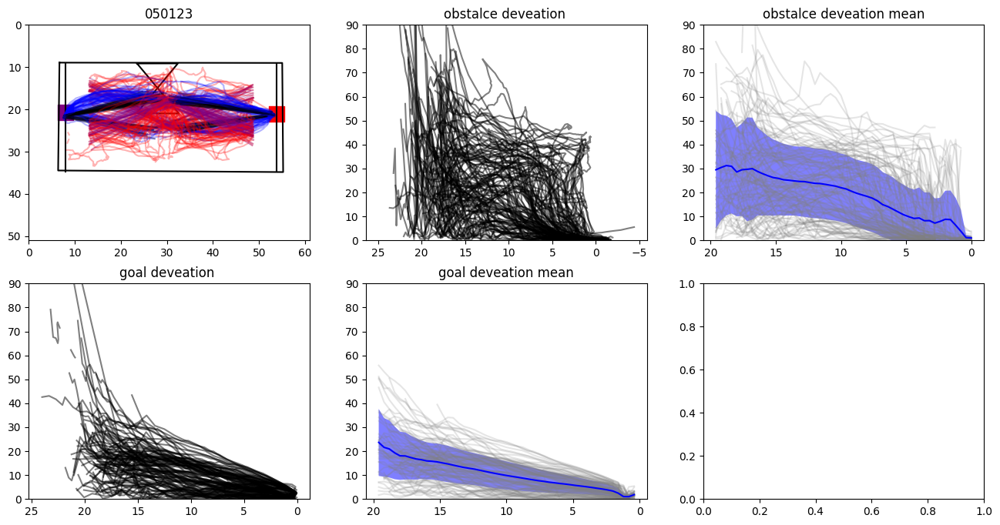

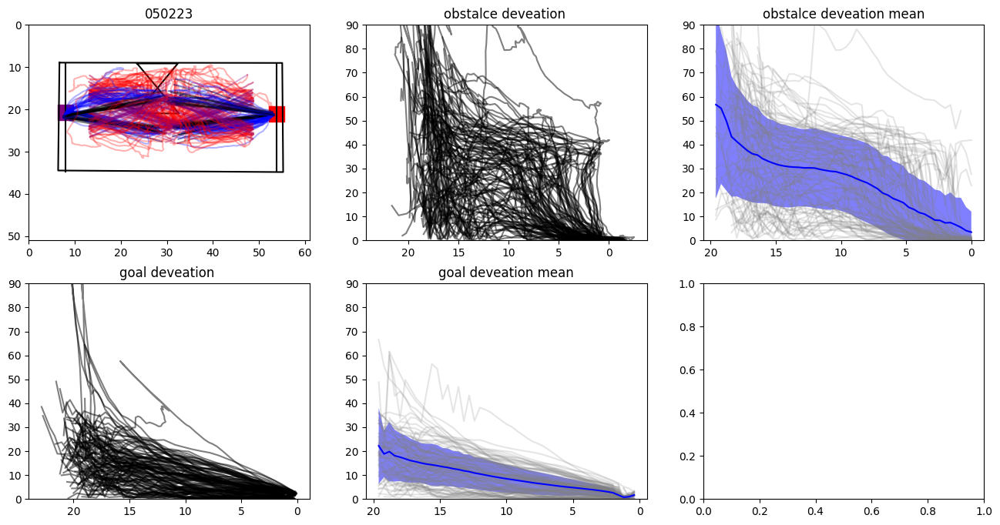

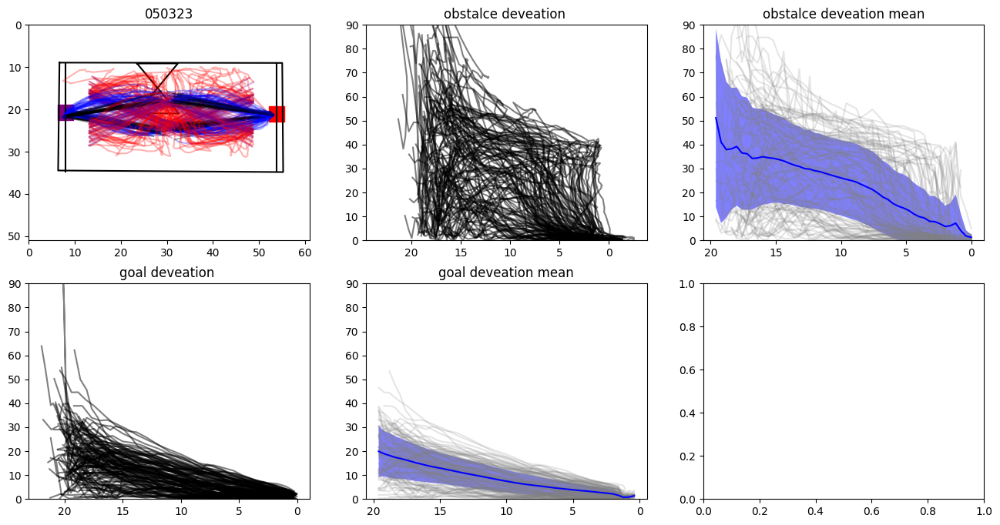

...

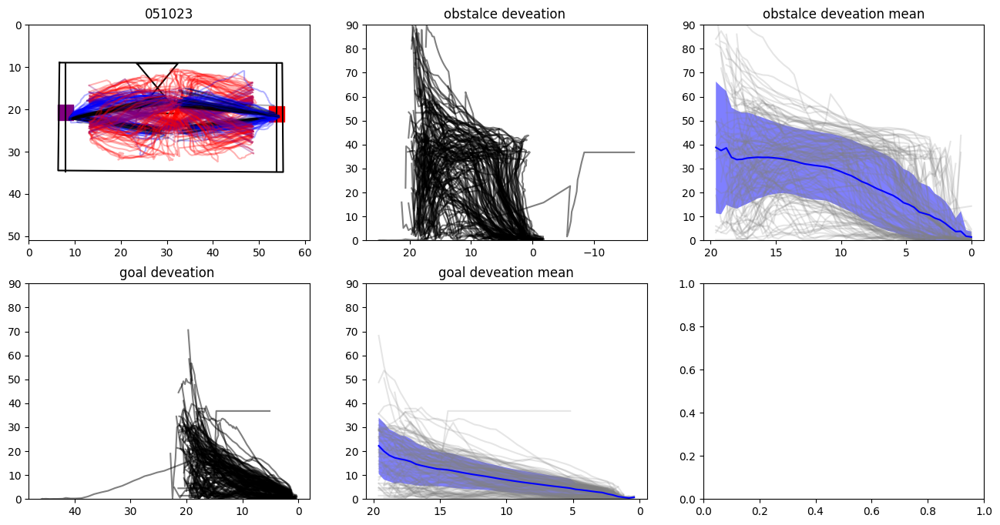

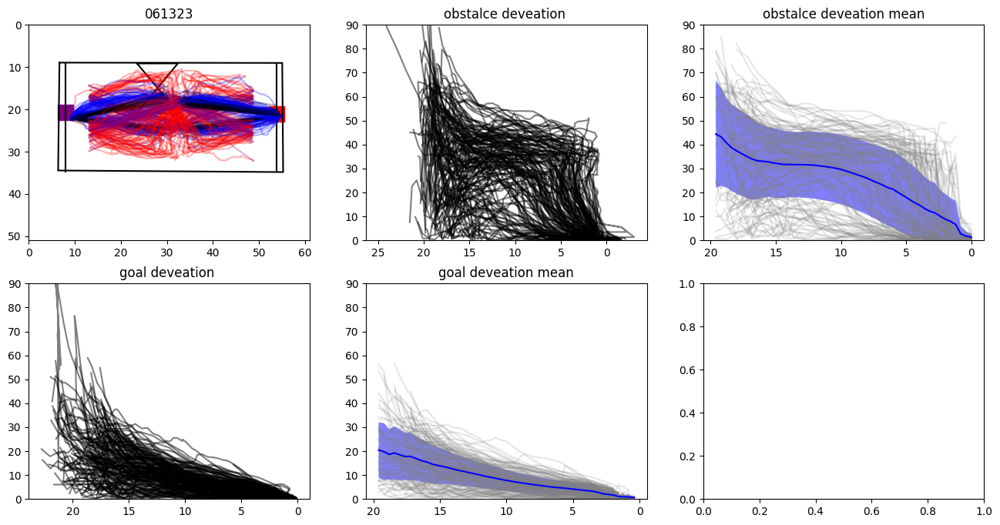

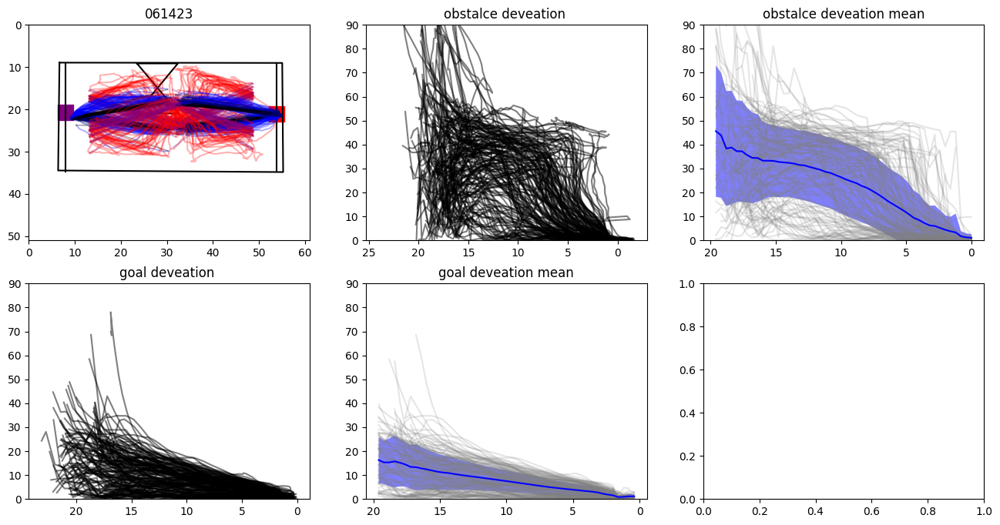

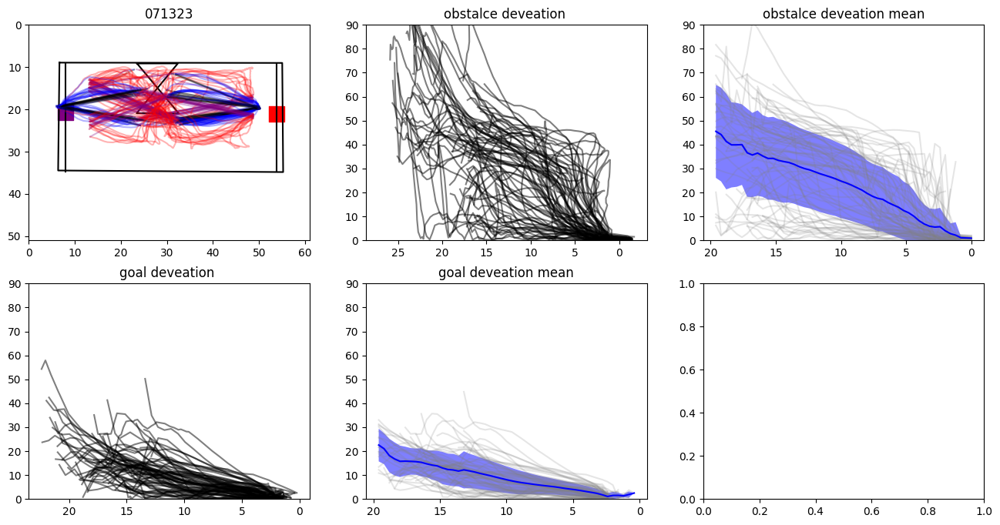

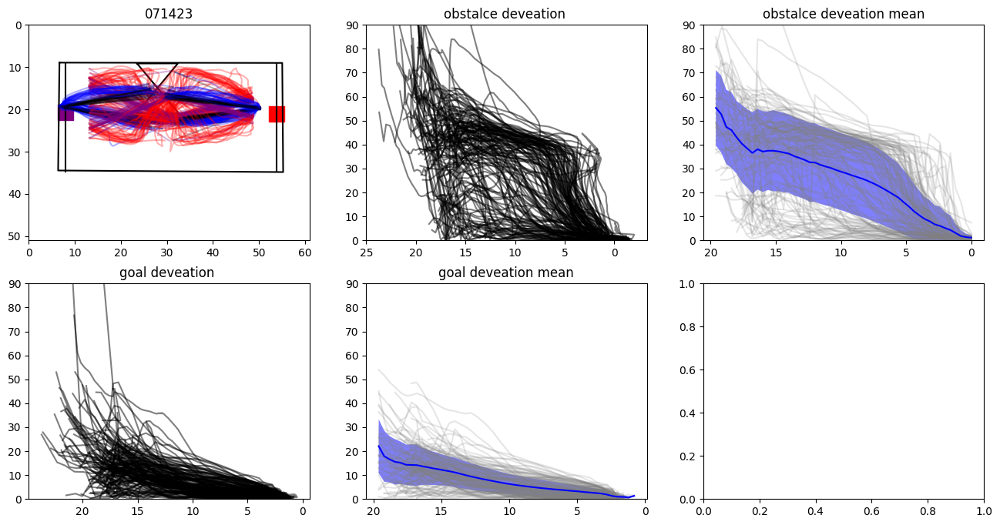

In [184]:
data = oa_long[oa_long["animal"].isin([i for i in oa_long.animal.unique().tolist() if '1' not in i])]
#data = data[(data['date'] != '071323')&(data['date'] != '071423')]
xnew =  np.arange(0, 20, .4)
by_date = data.groupby(['date'])
for date,date_df in by_date:
    fig,ax = plt.subplots(2,3,figsize=(16,8))
    ax[0,0].set_title(str(date))
    ax[0,1].set_title('obstalce deveation ')
    ax[0,1].set_ylim(0,90)
    ax[0,1].invert_xaxis()
    ax[0,2].set_title('obstalce deveation mean')
    ax[0,2].set_ylim(0,90)
    ax[0,2].invert_xaxis()
    ax[1,0].set_title('goal deveation ')
    ax[1,0].set_ylim(0,90)
    ax[1,0].invert_xaxis()
    ax[1,1].set_ylim(0,90)
    ax[1,1].set_title('goal deveation mean')
    ax[1,1].set_ylim(0,90)
    ax[1,1].invert_xaxis()
    plot_arena(date_df,ax[0,0],obstacle=True)

    
    for ind,row in date_df.iterrows():
        ax[0,0].plot(row.goal_nose_x,row.goal_nose_y,color = 'blue',alpha = .3)
        ax[0,0].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'red',alpha = .3)
        ax[0,0].plot((row.goal_basis_start_x,row.goal_basis_end_x),(row.goal_basis_start_y,row.goal_basis_end_y),color = 'black',alpha = .3)
        ax[0,0].plot((row.obstacle_basis_start_x,row.obstacle_basis_end_x),(row.obstacle_basis_start_y,row.obstacle_basis_end_y),color = 'purple',alpha = .3)
    rows = date_df.shape[0]
    obstalce_array = np.empty([rows,50])
    obstalce_array[:] =np.nan 
    

    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['obstacle_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['obstacle_devations'])
        ynew = interpolater(xnew)
        obstalce_array[i] = ynew
        

        ax[0,2].plot(xnew,ynew,c = 'grey',alpha = .2)
        ax[0,1].plot(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['obstacle_devations'],c = 'black',alpha = .5)
    ax[0,2].plot(xnew,np.nanmean(obstalce_array,axis = 0),c = 'blue')
    std_error_obstacle = np.nanstd(obstalce_array,axis=0)
    ax[0,2].fill_between(xnew, 
    np.nanmean(obstalce_array,axis = 0)-std_error_obstacle, 
    np.nanmean(obstalce_array,axis = 0)+std_error_obstacle, 
    facecolor='blue', alpha=0.5)

    rows = date_df.shape[0]
    goal_array = np.empty([rows,50])
    goal_array[:] =np.nan 
    

    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):].astype(float),row[1]['goal_devations'].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):],row[1]['goal_devations'])
        ynew = interpolater(xnew)
        goal_array[i] = ynew
        

        ax[1,1].plot(xnew,ynew,c = 'grey',alpha = .2)
        ax[1,0].plot(row[1]['ts_distance_from_target_port'][int(row[1]['goal_ind']):],row[1]['goal_devations'],c = 'black',alpha = .5)
    ax[1,1].plot(xnew,np.nanmean(goal_array,axis = 0),c = 'blue')
    std_error_obstacle = np.nanstd(goal_array,axis=0)
    ax[1,1].fill_between(xnew, 
    np.nanmean(goal_array,axis = 0)-std_error_obstacle, 
    np.nanmean(goal_array,axis = 0)+std_error_obstacle, 
    facecolor='blue', alpha=0.5)

<AxesSubplot: xlabel='date'>

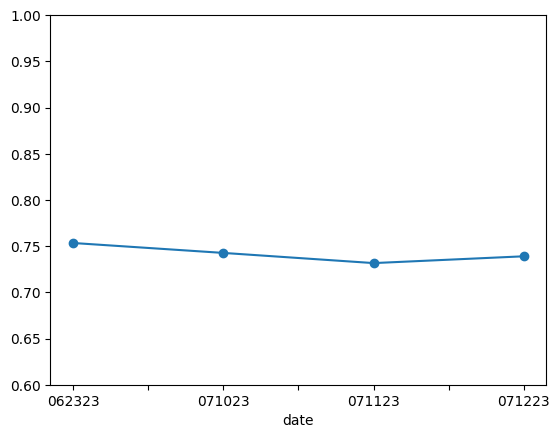

In [99]:
data = dark_long

data.groupby('date')['ob_linearity'].mean().plot(ylim=(.6, 1),style = '-o')

<AxesSubplot: xlabel='date'>

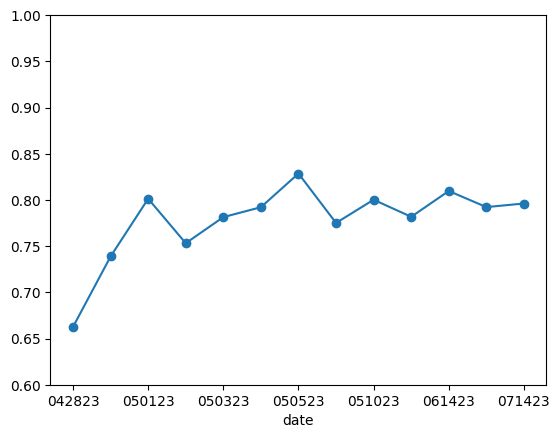

In [166]:
data = oa_long[oa_long["animal"].isin([i for i in oa_long.animal.unique().tolist() if '1' not in i])]

data.groupby('date')['ob_linearity'].mean().plot(ylim=(.6, 1),style = '-o')

<AxesSubplot: xlabel='date'>

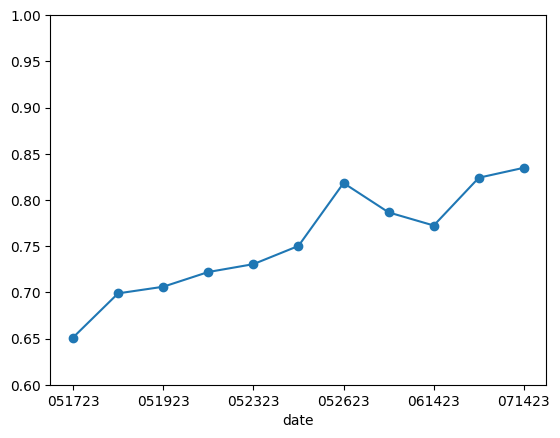

In [100]:
data = oa_long[oa_long["animal"].isin([i for i in oa_long.animal.unique().tolist() if '1' in i])]

data.groupby('date')['ob_linearity'].mean().plot(ylim=(.6, 1),style = '-o')

In [159]:
data.groupby('skill')['ob_linearity'].mean()

skill
early     0.758319
late      0.803376
middle    0.799634
naive     0.721428
Name: ob_linearity, dtype: float64

<AxesSubplot: xlabel='date'>

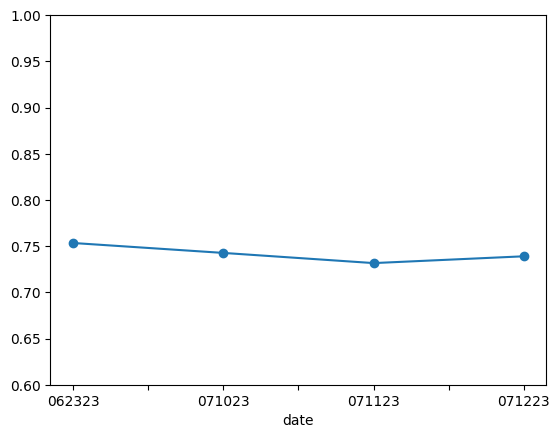

In [163]:
data = dark_long

data.groupby('date')['ob_linearity'].mean().plot(ylim=(.6, 1),style = '-o')

In [ ]:
data = oa_long

data.groupby('skill')['ob_linearity'].mean().reindex(index = ['naive','early','middle','late']).plot(style = '-o')

<AxesSubplot: xlabel='date'>

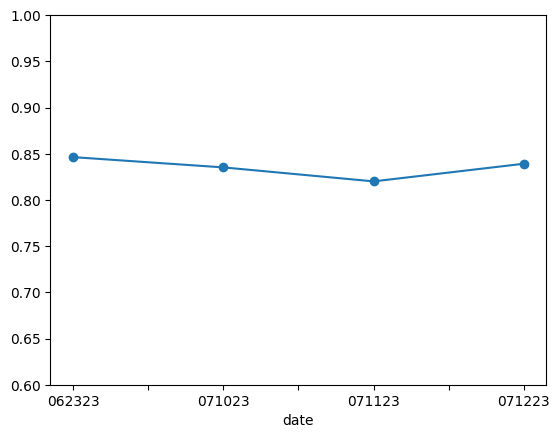

In [254]:
data_dark = dark_oa_df

data_dark.groupby('date')['ob_linearity'].mean().plot(ylim=(.6, 1),style = '-o')

In [260]:
dark_oa_df

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,goal_basis_start_x,goal_basis_start_y,goal_basis_end_x,goal_basis_end_y,obstacle_devations,goal_devations,ob_tortuosity,ob_linearity,go_tortuosity,go_linearity
0,19,26,41873.531788,41876.329740,"[41873.533401, 41873.550963, 41873.566771, 418...","[5247, 5248, 5249, 5250, 5251, 5252, 5253, 525...","[65.23957061767578, 64.81552124023438, 65.0534...","[275.5545959472656, 276.5697937011719, 277.131...","[82.81827545166016, 81.80592346191406, 81.2186...","[267.2843017578125, 268.1793212890625, 268.645...",...,21.291555,27.432616,49.318231,19.893742,"[nan, 43.69426365426878, 38.72052264681236, 34...","[nan, 29.993533735347633, 30.290882562747544, ...",1.566168,0.638501,1.051701,0.950841
3,23,30,41882.818214,41885.345638,"[41882.819904, 41882.83758, 41882.853337, 4188...","[5804, 5805, 5806, 5807, 5808, 5809, 5810, 581...","[67.2712631225586, 67.20787811279297, 67.08826...","[273.2563781738281, 272.62139892578125, 273.24...","[76.14929962158203, 75.99237060546875, 76.4370...","[266.09100341796875, 265.298095703125, 265.673...",...,30.160941,25.965259,49.103140,19.893373,"[nan, 11.979144127631074, 4.099677433743273, 0...","[nan, 27.106023293875086, 33.210994768084205, ...",1.021154,0.979284,1.137188,0.879362
4,24,31,41885.345638,41887.631475,"[41885.354009, 41885.370854, 41885.388416, 418...","[[5956, 5957, 5958, 5959, 5960, 5961, 5962, 59...","[658.0562744140625, 659.5247802734375, 660.648...","[266.2772216796875, 267.11212158203125, 267.59...","[644.9557495117188, 646.1011962890625, 646.663...","[260.47314453125, 259.2946472167969, 258.52416...",...,34.109061,25.283148,5.063429,20.424229,"[nan, 22.68772064151476, 28.121675139109165, 2...","[nan, 39.42078773390577, 40.784422124736516, 3...",1.052492,0.950126,1.096605,0.911905
5,25,32,41887.631475,41889.646822,"[41887.63831, 41887.656281, 41887.67159, 41887...","[6093, 6094, 6095, 6096, 6097, 6098, 6099, 610...","[67.47982788085938, 66.89169311523438, 67.4468...","[273.3269958496094, 273.5285949707031, 273.592...","[75.94951629638672, 75.58618927001953, 76.1229...","[266.4490051269531, 266.6357116699219, 266.589...",...,31.303007,24.319825,49.149220,19.849992,"[nan, 1.5579858108589477, 4.2897178089313766, ...","[nan, 4.539794897013662, 9.478388616395941, 9....",1.012957,0.987209,1.026341,0.974335
6,26,33,41889.646822,41891.907980,"[41889.655526, 41889.672448, 41889.690188, 418...","[[6214, 6215, 6216, 6217, 6218, 6219, 6220, 62...","[658.4691772460938, 659.8648071289062, 659.918...","[266.6318359375, 266.4527587890625, 267.018218...","[644.4957275390625, 646.5586547851562, 646.390...","[260.10174560546875, 258.29144287109375, 258.4...",...,34.595416,25.735539,4.993561,20.571396,"[nan, 2.413109817784022, 1.2214212175703025, 0...","[nan, 28.05497230582492, 21.70274622560469, 16...",1.009567,0.990524,1.084825,0.921808
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3968,66,78,56029.032947,56032.629555,"[56029.040921, 56029.057792, 56029.075737, 560...","[[20991, 20992, 20993, 20994, 20995, 20996, 20...","[673.8978271484375, 674.8469848632812, 674.964...","[262.5647277832031, 262.437255859375, 261.6487...","[663.4574584960938, 664.0390014648438, 664.742...","[247.28787231445312, 247.69454956054688, 247.2...",...,36.914025,17.266865,6.823026,19.684292,"[nan, 20.723019438464785, 36.30335724730807, 3...","[nan, 47.693146755852766, 46.95669247481183, 4...",1.077921,0.927712,1.548167,0.645925
3969,67,82,56099.096768,56101.353740,"[56099.098534, 56099.115302, 56099.131891, 560...","[[25193, 25194, 25195, 25196, 25197, 25198, 25...","[670.5661010742188, 671.2100830078125, 671.647...","[264.86920166015625, 265.5244445800781, 265.91...","[654.9926147460938, 659.0719604492188, 659.795...","[261.98809814453125, 261.3612365722656, 262.20...",...,34.221729,27.929198,6.899410,19.727243,"[nan, 1.0830235231375125, 10.190991647378963, ...","[nan, 4.6085981867

<AxesSubplot: xlabel='date'>

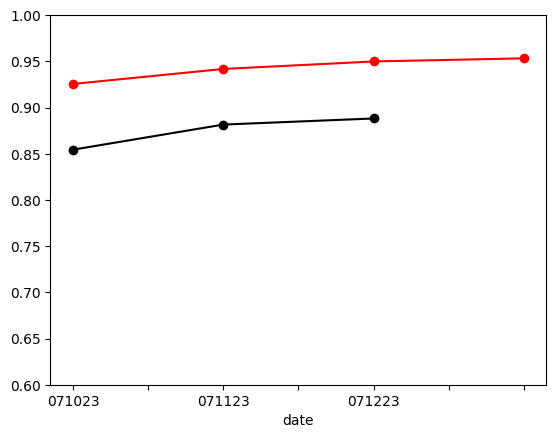

In [278]:
data = oa_df

data.groupby('skill')['go_linearity'].mean().reindex(index = ['naive','early','middle','late']).plot(ylim=(.6, 1),style = '-o',c ='red')

data_dark = dark_oa_df

data_dark.groupby('date')['go_linearity'].mean().plot(ylim=(.6, 1),style = '-o',c ='black')

<AxesSubplot: xlabel='date'>

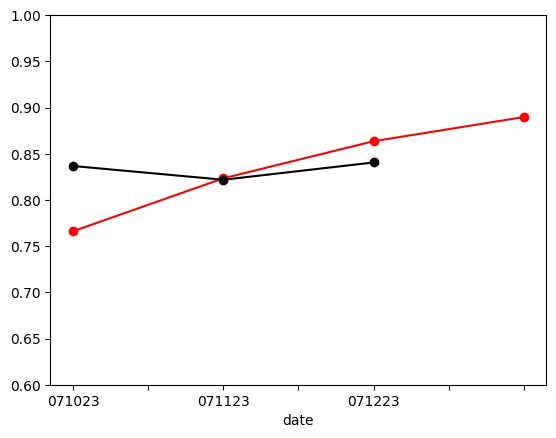

In [279]:
data = oa_df

data.groupby('skill')['ob_linearity'].mean().reindex(index = ['naive','early','middle','late']).plot(ylim=(.6, 1),style = '-o',c ='red')

data_dark = dark_oa_df

data_dark.groupby('date')['ob_linearity'].mean().plot(ylim=(.6, 1),style = '-o',c ='black')

<AxesSubplot: xlabel='date'>

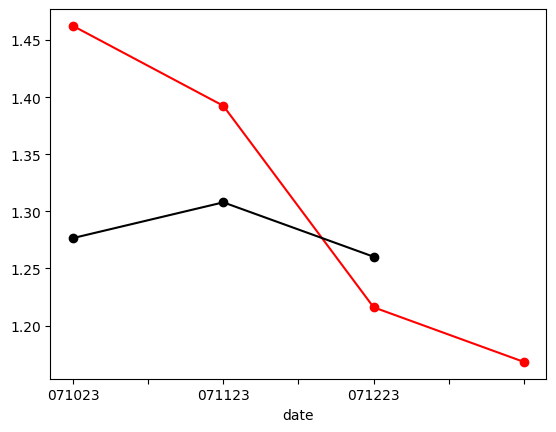

In [277]:
data = oa_df

data.groupby('skill')['ob_tortuosity'].mean().reindex(index = ['naive','early','middle','late']).plot(style = '-o',c ='red')

data_dark = dark_oa_df

data_dark.groupby('date')['ob_tortuosity'].mean().plot(style = '-o',c ='black')

<AxesSubplot: xlabel='date'>

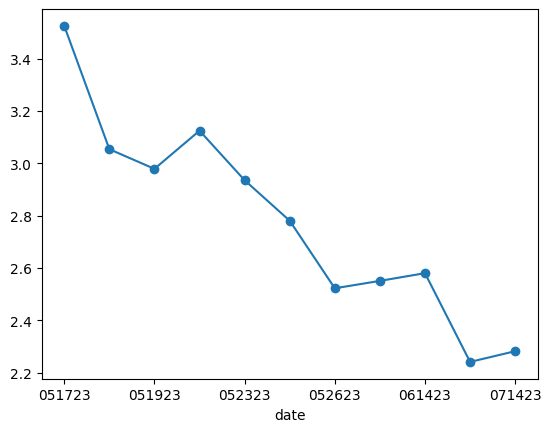

In [133]:
data = oa_df[oa_df["animal"].isin([i for i in oa_df.animal.unique().tolist() if '1' in i])]
data.groupby('date')['time'].mean().plot(style = '-o')

<AxesSubplot: xlabel='date'>

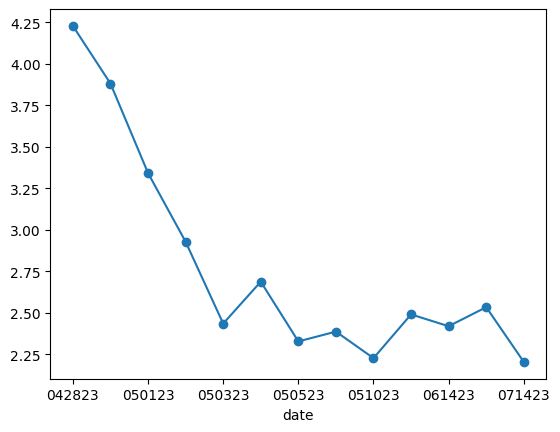

In [134]:
data = oa_df[oa_df["animal"].isin([i for i in oa_df.animal.unique().tolist() if '1' not in i])]
data.groupby('date')['time'].mean().plot(style = '-o')

In [ ]:
data = oa_long[oa_long["animal"].isin([i for i in oa_long.animal.unique().tolist() if '1' not in i])]

data.groupby('date')['ob_linearity'].mean().plot(ylim=(.6, 1),style = '-o')

In [342]:
def by_start_obstalce_average(df,var):
        #savepath = "D:/obstacle_avoidance/recordings"
        #savepath_session = os.path.join(*[savepath,'figures'])
        #savepath_session = os.path.join(*[savepath,str(pd.unique(df.date).item()),str(pd.unique(df.animal).item()),str(pd.unique(df.task).item())])
        #pdf = PdfPages(os.path.join((savepath_session), str(date)+ 'by_' +'_start_'+'obstacle' + 'consecutive.pdf'))
        key='start'
        fig = plt.figure(constrained_layout=False, figsize=(16, 10),dpi=90)
        fig.suptitle('by ' + key + ' '+ 'and ' +'obstacle ')
        spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)


        """Right"""
        panel_1 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[0])
        ax1 = fig.add_subplot(panel_1[0,0])
        plot_arena(df,ax1)
        ax2 = fig.add_subplot(panel_1[0,1])
        plot_arena(df,ax2)
        ax2.set_title('right')
        ax3 = fig.add_subplot(panel_1[1,0])
        plot_arena(df,ax3)
        ax4 = fig.add_subplot(panel_1[1,1])
        plot_arena(df,ax4)
        ax5 = fig.add_subplot(panel_1[2,0])
        plot_arena(df,ax5)
        ax6 = fig.add_subplot(panel_1[2,1])
        plot_arena(df,ax6)

        right_axs = [ax1,ax2,ax3,ax4,ax5,ax6]


        """Left """
        panel_2 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[1])
        ax7 = fig.add_subplot(panel_2[0,0])
        plot_arena(df,ax7)
        ax8 = fig.add_subplot(panel_2[0,1])
        plot_arena(df,ax8)
        ax8.set_title('left')
        ax9 = fig.add_subplot(panel_2[1,0])
        plot_arena(df,ax9)
        ax10 = fig.add_subplot(panel_2[1,1])
        plot_arena(df,ax10)
        ax11= fig.add_subplot(panel_2[2,0])
        plot_arena(df,ax11)
        ax12 = fig.add_subplot(panel_2[2,1])
        plot_arena(df,ax12)

        left_axs = [ax7,ax8,ax9,ax10,ax11,ax12]




        """ plot trials"""
        right_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),right_axs))
        left_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),left_axs))

        for direction, direction_frame in df.groupby(['odd']):
            for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
                #cluster_frame = cluster_frame.sample(num_sample)
                right_obstacle_axis = right_obstacle_dict.get(cluster)
                left_obstacle_axis = left_obstacle_dict.get(cluster)
                plot_obstacle(cluster_frame,right_obstacle_axis,cluster)
                plot_obstacle(cluster_frame,left_obstacle_axis,cluster)
                right_obstacle_axis.set_title(str(cluster))
                left_obstacle_axis.set_title(str(cluster))
                for start, start_frame in cluster_frame.groupby(['start']):
                     if direction == 'right':
                          if start == 'top':
                              if cluster in [2,3]:
                                   ob_median_x = get_median_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_median_y = get_median_of_df(start_frame,'ts_nose_y_cm',50)
                                   right_obstacle_axis.plot(ob_median_x,ob_median_y,color = 'tab:orange')                                                                                 
                              else:     
                                   ob_mean_x = get_mean_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_mean_y = get_mean_of_df(start_frame,'ts_nose_y_cm',50)
                                   right_obstacle_axis.plot(ob_mean_x,ob_mean_y,color = 'tab:orange')
           
                              if cluster in [2,3]:
                                   ob_median_x = get_median_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_median_y = get_median_of_df(start_frame,'ts_nose_y_cm',50)
                                   right_obstacle_axis.plot(ob_median_x,ob_median_y,color = 'black')
                              else:     
                                   ob_mean_x = get_mean_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_mean_y = get_mean_of_df(start_frame,'ts_nose_y_cm',50)
                                   right_obstacle_axis.plot(ob_mean_x,ob_mean_y,color = 'black')
           
                               
                     if direction == 'left':
                          if start == 'top':
                              if cluster in [2,3]:
                                   ob_median_x = get_median_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_median_y = get_median_of_df(start_frame,'ts_nose_y_cm',50)
                                   left_obstacle_axis.plot(ob_median_x,ob_median_y,color = 'tab:orange')
                              else:     
                                   ob_mean_x = get_mean_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_mean_y = get_mean_of_df(start_frame,'ts_nose_y_cm',50)
                                   left_obstacle_axis.plot(ob_mean_x,ob_mean_y,color = 'tab:orange')
           
                              
                          if start == 'bottom':
                              if cluster in [2,3]:
                                   ob_median_x = get_median_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_median_y = get_median_of_df(start_frame,'ts_nose_y_cm',50)
                                   left_obstacle_axis.plot(ob_median_x,ob_median_y,color = 'black')
                              else:     
                                   ob_mean_x = get_mean_of_df(start_frame,'ts_nose_x_cm',50) 
                                   ob_mean_y = get_mean_of_df(start_frame,'ts_nose_y_cm',50)
                                   left_obstacle_axis.plot(ob_mean_x,ob_mean_y,color = 'black')
                #color_map_top = create_color_dict(data,var,'magma',sort=False)
                color_map = create_color_dict(df,var,'magma',sort=False)
                markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
                ax1.legend(markers, color_map.keys(), numpoints=1,title = var)
                for start, start_frame in cluster_frame.groupby(['start']):
                    for vari, var_frame in start_frame.groupby([var]):
                         color = color_map.get(vari)
                         if direction == 'right':
                          if start == 'top':
                              if cluster in [2,3]:
                                   ob_median_x = get_median_of_df(var_frame,'ts_nose_x_cm',50) 
                                   ob_median_y = get_median_of_df(var_frame,'ts_nose_y_cm',50)
                                   right_obstacle_axis.plot(ob_median_x,ob_median_y,color = color)                                                                                 
                              else:     
                                   ob_mean_x = get_mean_of_df(var_frame,'ts_nose_x_cm',50) 
                                   ob_mean_y = get_mean_of_df(var_frame,'ts_nose_y_cm',50)
                                   right_obstacle_axis.plot(ob_mean_x,ob_mean_y,color = color)
                          if start == 'bottom':
                              if cluster in [2,3]:
                                   ob_median_x = get_median_of_df(var_frame,'ts_nose_x_cm',50) 
                                   ob_median_y = get_median_of_df(var_frame,'ts_nose_y_cm',50)
                                   right_obstacle_axis.plot(ob_median_x,ob_median_y,color = color)
                              else:     
                                   ob_mean_x = get_mean_of_df(var_frame,'ts_nose_x_cm',50) 
                                   ob_mean_y = get_mean_of_df(var_frame,'ts_nose_y_cm',50)
                                   right_obstacle_axis.plot(ob_mean_x,ob_mean_y,color = color)
           
                               
                         if direction == 'left':
                             if start == 'top':
                                 if cluster in [2,3]:
                                      ob_median_x = get_median_of_df(var_frame,'ts_nose_x_cm',50) 
                                      ob_median_y = get_median_of_df(var_frame,'ts_nose_y_cm',50)
                                      left_obstacle_axis.plot(ob_median_x,ob_median_y,color = color)
                                 else:     
                                      ob_mean_x = get_mean_of_df(var_frame,'ts_nose_x_cm',50) 
                                      ob_mean_y = get_mean_of_df(var_frame,'ts_nose_y_cm',50)
                                      left_obstacle_axis.plot(ob_mean_x,ob_mean_y,color = color)
                             if start == 'bottom':
                                 if cluster in [2,3]:
                                      ob_median_x = get_median_of_df(var_frame,'ts_nose_x_cm',50) 
                                      ob_median_y = get_median_of_df(var_frame,'ts_nose_y_cm',50)
                                      left_obstacle_axis.plot(ob_median_x,ob_median_y,color = color)
                                 else:     
                                      ob_mean_x = get_mean_of_df(var_frame,'ts_nose_x_cm',50) 
                                      ob_mean_y = get_mean_of_df(var_frame,'ts_nose_y_cm',50)
                                      left_obstacle_axis.plot(ob_mean_x,ob_mean_y,color = color )  
               
                               
                                        
                                   
                                        
           


In [ ]:
        for start, start_frame in cluster_frame.groupby(['start']):
                   if direction == 'right':
                       if start == 'top':
                           if cluster in [2,3]:
                               right_obstacle_axis.plot(np.linspace(10,50,50),start_frame['median_interp_ts_nose_y_cm'].to_numpy()[0],c = 'black')
                               right_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame['median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame['median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='black', alpha=0.5)
                           else:
                               right_obstacle_axis.plot(np.linspace(10,50,50),start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0],c = 'black')
                               right_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='black', alpha=0.5)
                       if start == 'bottom':
                           if cluster in [2,3]:
                               right_obstacle_axis.plot(np.linspace(10,50,50),start_frame['median_interp_ts_nose_y_cm'].to_numpy()[0],c = 'red')
                               right_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame['median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame['median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='red', alpha=0.5)
                           else:
                               right_obstacle_axis.plot(np.linspace(10,50,50),start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0],c = 'red')
                               right_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='red', alpha=0.5)
                   if direction == 'left':
                       if start == 'top':
                            if cluster in [2,3]:
                               left_obstacle_axis.plot(np.linspace(10,50,50),start_frame['median_interp_ts_nose_y_cm'].to_numpy()[0],c = 'black')
                               left_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame['median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame['median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='black', alpha=0.5)
                            else:
                               left_obstacle_axis.plot(np.linspace(10,50,50),start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0],c = 'black')
                               left_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='black', alpha=0.5)
                       if start == 'bottom':
                           if cluster in [2,3]:
                               
                           else:
                               left_obstacle_axis.plot(np.linspace(10,50,50),start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0],c = 'red')
                               left_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame['mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='red', alpha=0.5)

              
                    

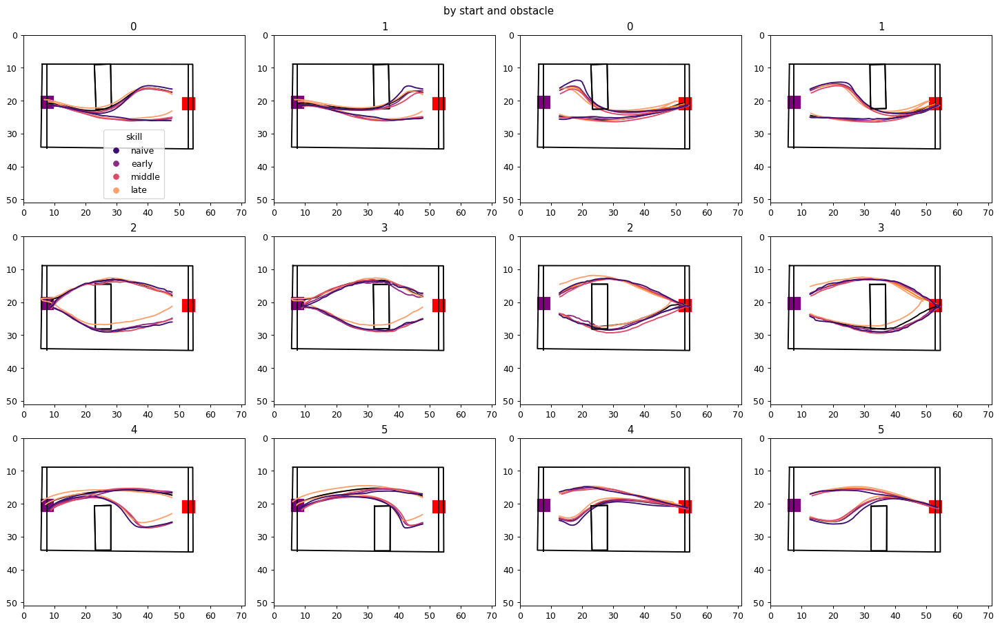

In [343]:
by_start_obstalce_average(oa_df,'skill')

In [341]:
dark_oa_df.date.unique()

array(['071023', '071123', '071223'], dtype=object)

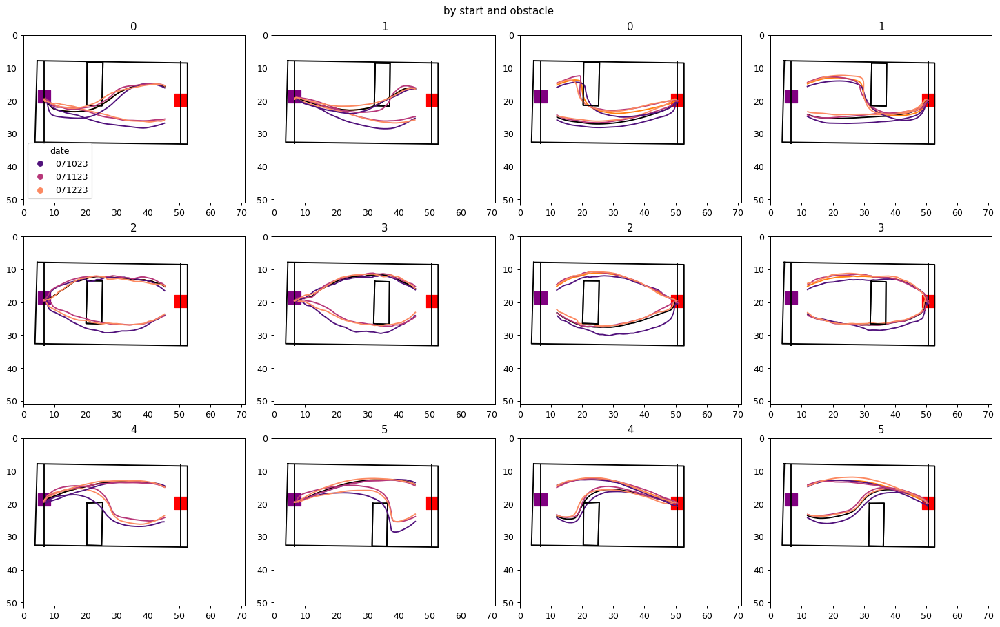

In [344]:
by_start_obstalce_average(dark_oa_df,'date')

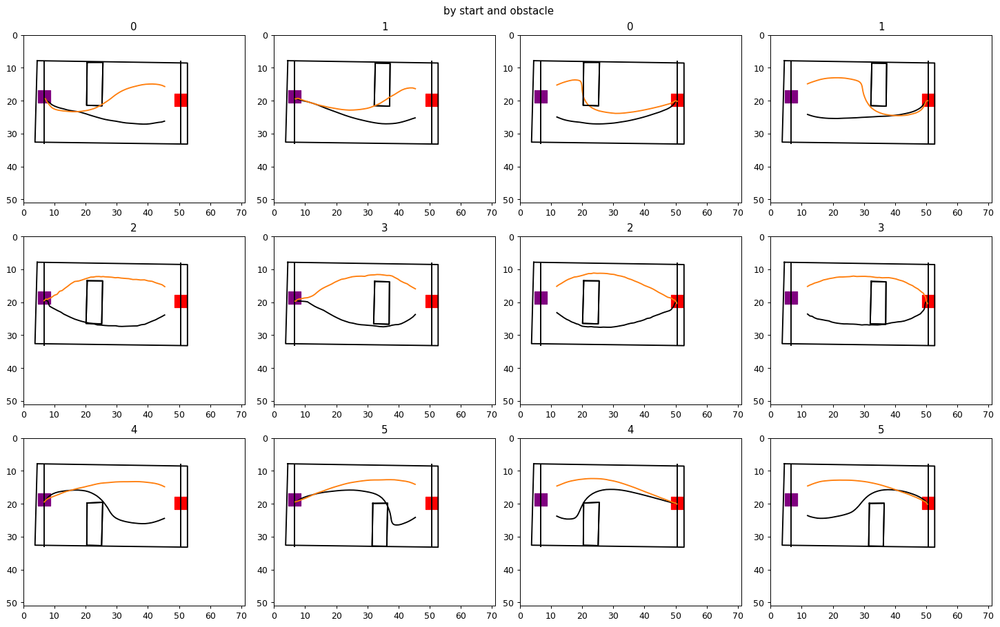

In [323]:
by_start_obstalce_average(dark_oa_df)

In [392]:
def plot_trials_sample(df,sample):
    """Direction by key obstalce trials"""
   
    fig = plt.figure(constrained_layout=False, figsize=(20, 10),dpi=90)
    
    spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
    """Right"""
    panel_1 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[0])
    ax1 = fig.add_subplot(panel_1[0,0])
    plot_arena(df,ax1)
    ax2 = fig.add_subplot(panel_1[0,1])
    plot_arena(df,ax2)
    ax2.set_title('right')
    ax3 = fig.add_subplot(panel_1[1,0])
    plot_arena(df,ax3)
    ax4 = fig.add_subplot(panel_1[1,1])
    plot_arena(df,ax4)
    ax5 = fig.add_subplot(panel_1[2,0])
    plot_arena(df,ax5)
    ax6 = fig.add_subplot(panel_1[2,1])
    plot_arena(df,ax6)
    right_axs = [ax1,ax2,ax3,ax4,ax5,ax6]

    """Left """
    panel_2 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[1])
    ax7 = fig.add_subplot(panel_2[0,0])
    plot_arena(df,ax7)
    ax8 = fig.add_subplot(panel_2[0,1])
    plot_arena(df,ax8)
    ax8.set_title('left')
    ax9 = fig.add_subplot(panel_2[1,0])
    plot_arena(df,ax9)
    ax10 = fig.add_subplot(panel_2[1,1])
    plot_arena(df,ax10)
    ax11= fig.add_subplot(panel_2[2,0])
    plot_arena(df,ax11)
    ax12 = fig.add_subplot(panel_2[2,1])
    plot_arena(df,ax12)
    left_axs = [ax7,ax8,ax9,ax10,ax11,ax12]
   
    
    

    """ plot trials"""
    right_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),right_axs))
    left_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),left_axs))
    for direction, direction_frame in df.groupby(['odd']):
        for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
            cluster_frame = cluster_frame.sample(sample)
            right_obstacle_axis = right_obstacle_dict.get(cluster)
            left_obstalce_axis = left_obstacle_dict.get(cluster)
            plot_orginal_obstacle(cluster_frame,right_obstacle_axis,cluster)
            plot_orginal_obstacle(cluster_frame,left_obstalce_axis,cluster)
            right_obstacle_axis.set_title(str(cluster))
            left_obstalce_axis.set_title(str(cluster))
            for ind,row in cluster_frame.iterrows():
                if direction == 'right':
                    if row.start == 'top':
                        which_axis = right_obstacle_dict.get(cluster)
                        which_axis.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'],c = 'red',alpha = .25)
                    if row.start == 'bottom':
                        which_axis = right_obstacle_dict.get(cluster)
                        which_axis.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'],c = 'black',alpha = .25)
                if direction == 'left':
                    if row.start == 'top':
                        which_axis = left_obstacle_dict.get(cluster)
                        which_axis.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'],c = 'red',alpha = .25)
                    if row.start == 'bottom':
                        which_axis = left_obstacle_dict.get(cluster)
                        which_axis.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'],c = 'black',alpha = .25)

In [ ]:
plot

In [ ]:
plot_orginal_obstacle

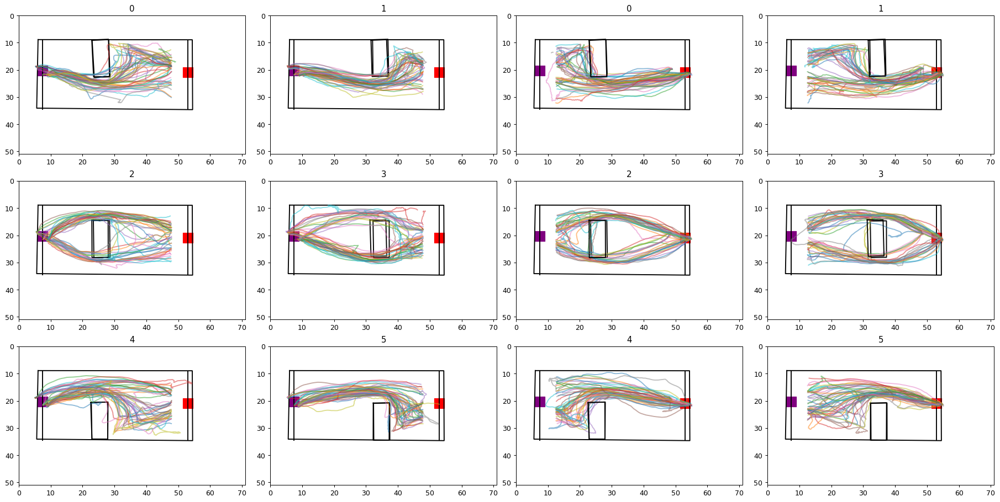

In [385]:
plot_trials_sample(oa_df,50)

early
late
middle
naive


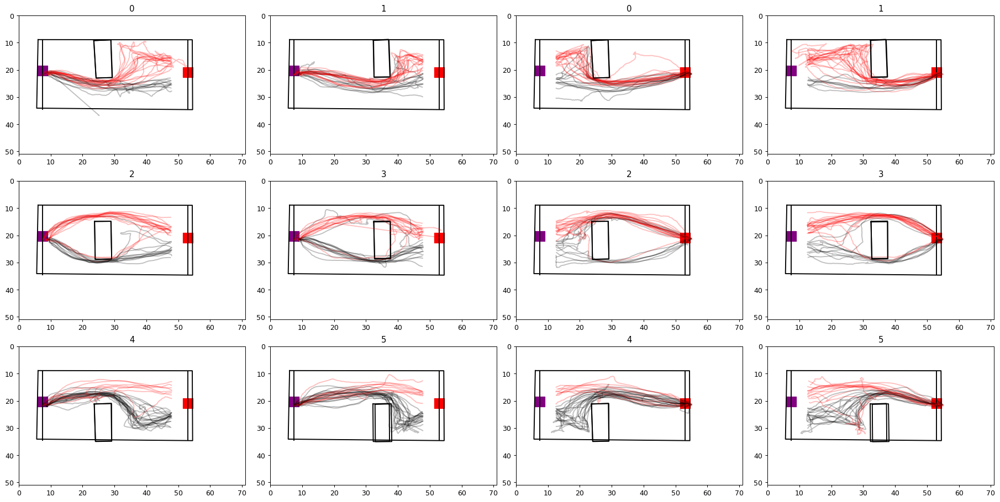

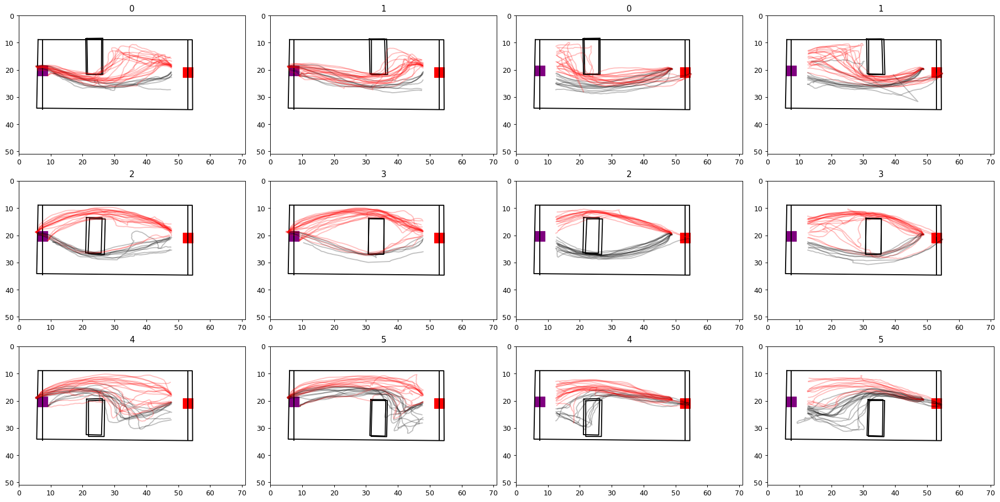

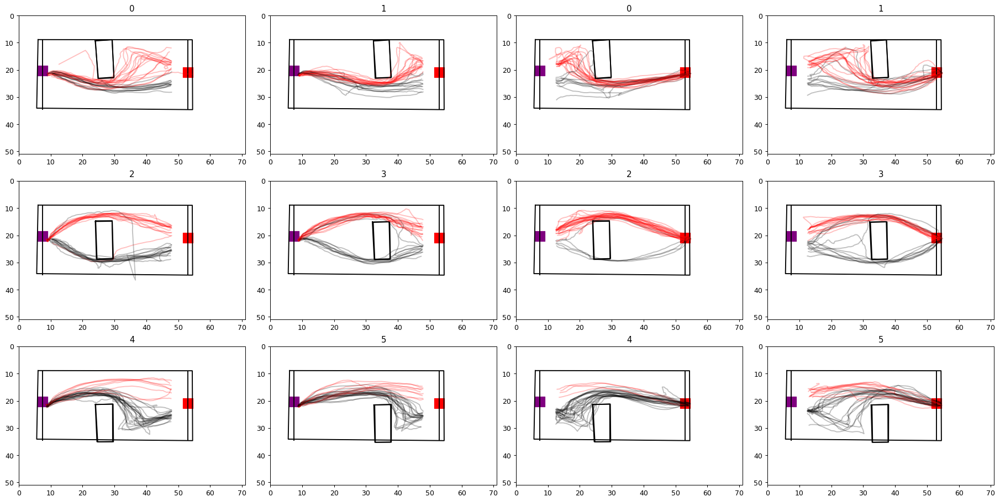

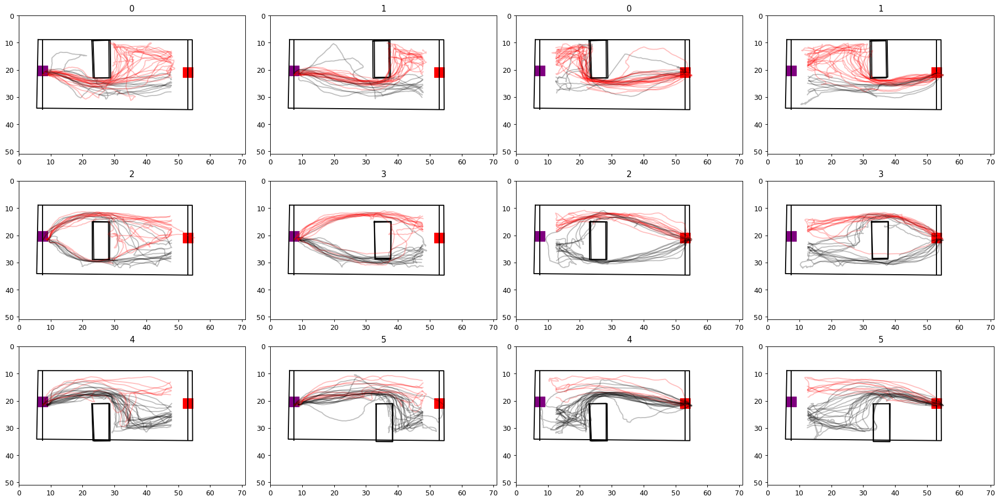

In [393]:
for skill,skill_frame in oa_df.groupby(['skill']):
    print(skill)
    plot_trials_sample(skill_frame,30)
    

In [396]:
oa_long.groupby(['skill'])['ts_distance_from_edge']

In [397]:
naive = oa_long[oa_long['skill']=='naive']


,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,goal_basis_end_x,goal_basis_end_y,obstacle_devations,goal_devations,ob_tortuosity,ob_linearity,go_tortuosity,go_linearity,skill,ts_lateral_error
18,19,23.0,55968.446784,55972.150118,"[55968.457036, 55968.474214, 55968.490777, 559...","[[7724, 7725, 7726, 7727, 7728, 7729, 7730, 77...","[684.8956909179688, 685.5166625976562, 686.734...","[276.1261901855469, 276.2704162597656, 276.096...","[669.5835571289062, 670.5010375976562, 671.231...","[272.48040771484375, 271.9192810058594, 271.15...",...,9.206374,21.498607,"[nan, 64.75348288439682, 56.632386350392956, 5...","[nan, 18.539437798862654, 16.63680939629646, 1...",1.648423,0.606640,1.035650,0.965577,naive,NaN
29,30,35.0,56025.418905,56030.842496,"[56025.427046, 56025.443699, 56025.460428, 560...","[[11141, 11142, 11143, 11144, 11145, 11146, 11...","[681.3780517578125, nan, nan, nan, nan, nan, n...","[275.2206115722656, nan, nan, nan, nan, nan, n...","[669.8692626953125, 671.6943969726562, 674.338...","[268.4548034667969, 268.9363708496094, 268.745...",...,9.085787,22.391738,"[nan, 55.14409610406446, 39.655961889041315, 4...","[nan, 39.575898033332194, 32.19636281105566, 3...",1.649958,0.606076,1.060052,0.943350,naive,NaN
40,41,47.0,56089.383270,56096.416729,"[56089.399347, 56089.415577, 56089.432332, 560...","[[14978, 14979, 14980, 14981, 14982, 14983, 14...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[675.2911376953125, 677.028076171875, 678.3170...","[264.6787414550781, 265.697021484375, 266.2087...",...,7.699420,21.705703,"[nan, 83.19062452332662, 60.67378176503683, 68...","[nan, 36.08340033788272, 17.262240174275064, 1...",1.834629,0.545069,1.048259,0.953963,naive,NaN
42,43,49.0,56101.012761,56104.130214,"[56101.019648, 56101.036364, 56101.053452, 561...","[[15675, 15676, 15677, 15678, 15679, 15680, 15...","[686.4649658203125, 685.9793090820312, nan, na...","[275.90142822265625, 277.9461975097656, nan, n...","[670.5230712890625, 671.7032470703125, 672.822...","[271.092041015625, 270.7273864746094, 270.5169...",...,7.503805,21.916393,"[nan, 8.256879947189939, 23.680910013710047, 1...","[nan, 10.22227058844762, 8.620681727550952, 9....",1.064221,0.939654,1.076798,0.928680,naive,NaN
55,56,63.0,56172.563955,56176.160588,"[56172.578176, 56172.594867, 56172.612428, 561...","[[19967, 19968, 19969, 19970, 19971, 19972, 19...","[683.0909423828125, 684.2697143554688, 686.127...","[274.2113342285156, 273.2940673828125, 273.591...","[667.3619384765625, 669.4915771484375, 673.093...","[271.208740234375, 271.1734924316406, 270.4080...",...,8.853785,20.062080,"[nan, 37.43740915655736, 41.13648369802006, 36...","[nan, 16.968072488813373, 20.19123056367053, 2...",1.556092,0.642635,1.022401,0.978090,naive,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5701,30,30.0,47804.818956,47807.637248,"[47804.835379, 47804.851302, 47804.867916, 478...","[5190, 5191, 5192, 5193, 5194, 5195, 5196, 519...","[110.31377410888672, 110.43212127685547, 110.1...","[272.6701354980469, 273.0883483886719, 272.862...","[131.92759704589844, 132.38150024414062, 131.9...","[271.64404296875, 271.0944519042969, 271.02407...",...,54.321401,21.242951,"[nan, 64.85371481643107, 66.38561123755508, 72...","[nan, 19.92897068147206, 25.362814018804787, 2...",1.444155,0.692446,1.046780,0.955310,naive,NaN
5703,32,32.0,47810.721881,47813.216473,"[47810.736512, 47810.753254, 47810.770713, 478...","[5544, 5545, 5546, 5547, 5548, 5549, 5550, 555...","[111.91423797607422, 111.3005142211914, 110.89...","[272.45513916015625, 272.26861572265625, 272.4...","[131.2439727783203, 129.54550170898438, 128.60...","[271.7565612792969, 271.3213195800781, 271.603...",...,54.354355,21.169084,"[nan, 47.84453923886895, 47.26115969951011, 46...","[nan, 32.03285457583283, 28.928865707314674, 2...",1.514256,0.660390,1.032762,0.968277,naive,Na

In [425]:
def distance_to_edge_vector(df):
    distance_vec = []
    for ind,row in df.iterrows():
        try:
            obstacle_distances = row['ts_distance_from_edge'][:int(row['obstacle_ind'])].astype(float)
            distance_vec.append(obstacle_distances)
        except ValueError:
            continue
    return np.concatenate(distance_vec).ravel()


In [437]:
naive = oa_long[oa_long['skill']=='naive']
naive_distances = distance_to_edge_vector(naive)
naive_df = {'type': 'naive', 'distances': naive_distances.astype(object)}
naive_df = pd.DataFrame.from_dict(naive_df)


early = oa_long[oa_long['skill']=='early']
early_distances = distance_to_edge_vector(early)
early_df = {'type': 'early', 'distances': early_distances.astype(object)}
early_df = pd.DataFrame.from_dict(early_df)


middle = oa_long[oa_long['skill']=='middle']
middle_distances = distance_to_edge_vector(middle)
middle_df = {'type': 'middle', 'distances': middle_distances.astype(object)}
middle_df = pd.DataFrame.from_dict(middle_df)



late = oa_long[oa_long['skill']=='late']
late_distances = distance_to_edge_vector(late)
late_distances_df = {'type': 'late', 'distances': late_distances.astype(object)}
late_distances_df = pd.DataFrame.from_dict(late_distances_df)

distances = pd.concat([naive_df,early_df,middle_df,late_distances_df])


In [432]:
naive_df = {'type': 'naive', 'distances': naive_distances.astype(object)}
naive_df = pd.DataFrame.from_dict(naive_df)

In [433]:
naive_df

,type,distances
0,naiv,18.742664
1,naiv,18.350105
2,naiv,17.77519
3,naiv,17.458397
4,naiv,17.160898
...,...,...
39100,naiv,7.024329
39101,naiv,6.92129
39102,naiv,6.933077
39103,naiv,6.88232


ValueError: could not convert string to float: 'naiv'

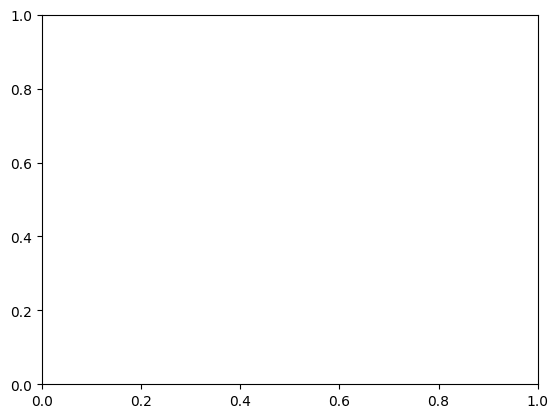

In [434]:
sns.distplot(naive_df, hist = False, kde = True,
                 kde_kws = {'linewidth': 3},color = 'blue'
                 )

<AxesSubplot: ylabel='Density'>

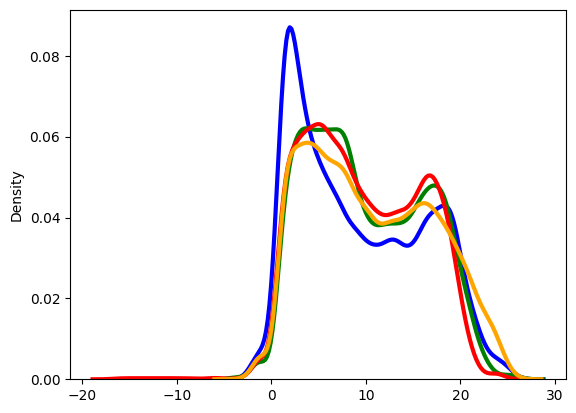

In [431]:
sns.distplot(naive_distances, hist = False, kde = True,
                 kde_kws = {'linewidth': 3},color = 'blue'
                 )

sns.distplot(early_distances, hist = False, kde = True,
                 kde_kws = {'linewidth': 3}, color ='green'
                 )
    
sns.distplot(middle_distances, hist = False, kde = True,
                 kde_kws = {'linewidth': 3}, color = 'red'
                 )

sns.distplot(late_distances, hist = False, kde = True,
                 kde_kws = {'linewidth': 3}, color ='orange'
                 )

<AxesSubplot: xlabel='distances', ylabel='Density'>

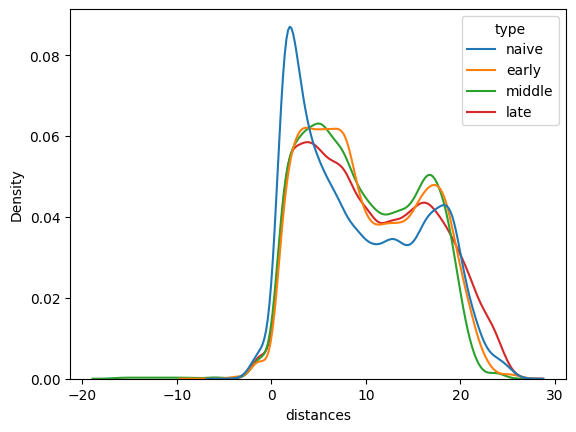

In [439]:
fig,ax = plt.subplots()
sns.kdeplot(hue =distances.type, x=distances.distances, data=distances,ax = ax,common_norm=False)

In [449]:
df.obstacle_nose_x

3       [12.589596017617145, 12.710951686396676, 12.75...
26      [12.627957608842417, 12.740180354515061, 12.99...
28      [12.79796301913818, 13.244794477955512, 13.759...
60      [13.140081892613763, 13.42815838620155, 13.945...
90      [13.011892956989557, 13.175644785471738, 13.38...
                              ...                        
5701    [12.581185242491792, 12.782018228027624, 12.98...
5703    [12.703272833885073, 13.171879938378488, 13.59...
5737    [12.869736633593039, 13.282416080562552, 13.71...
5764    [12.621659047521087, 13.02870355354765, 13.301...
5795    [13.063657440880974, 13.595098390352076, 14.03...
Name: obstacle_nose_x, Length: 153, dtype: object

In [442]:
distances.groupby(['type']).count()

,distances
type,
early,34675
late,41051
middle,30239
naive,39105


In [448]:
ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 

In [447]:
ob_mean_x

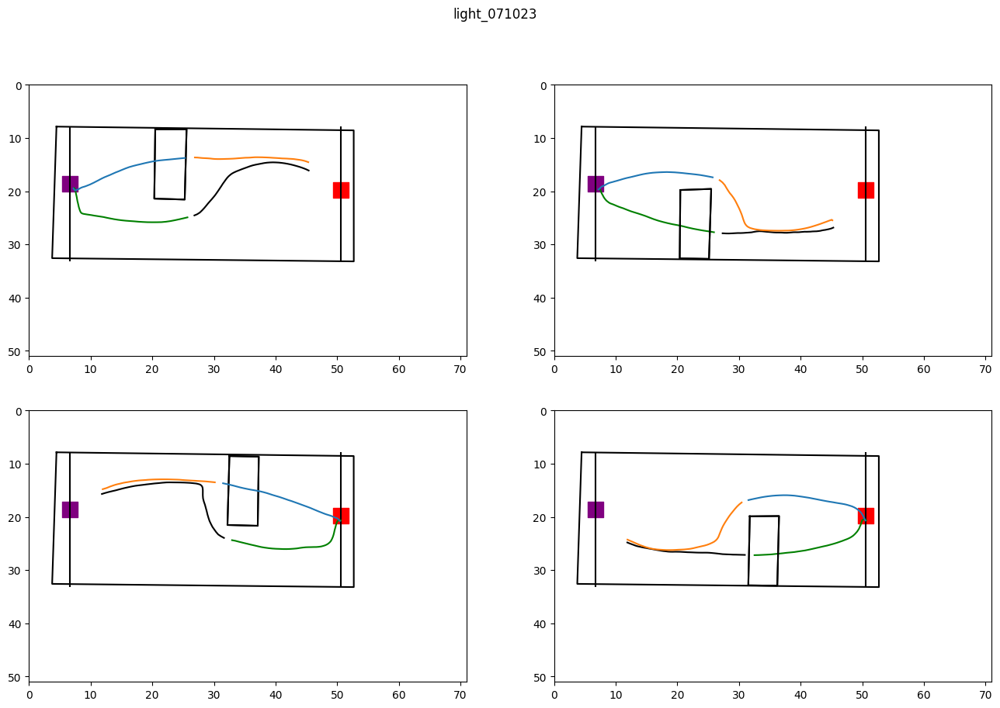

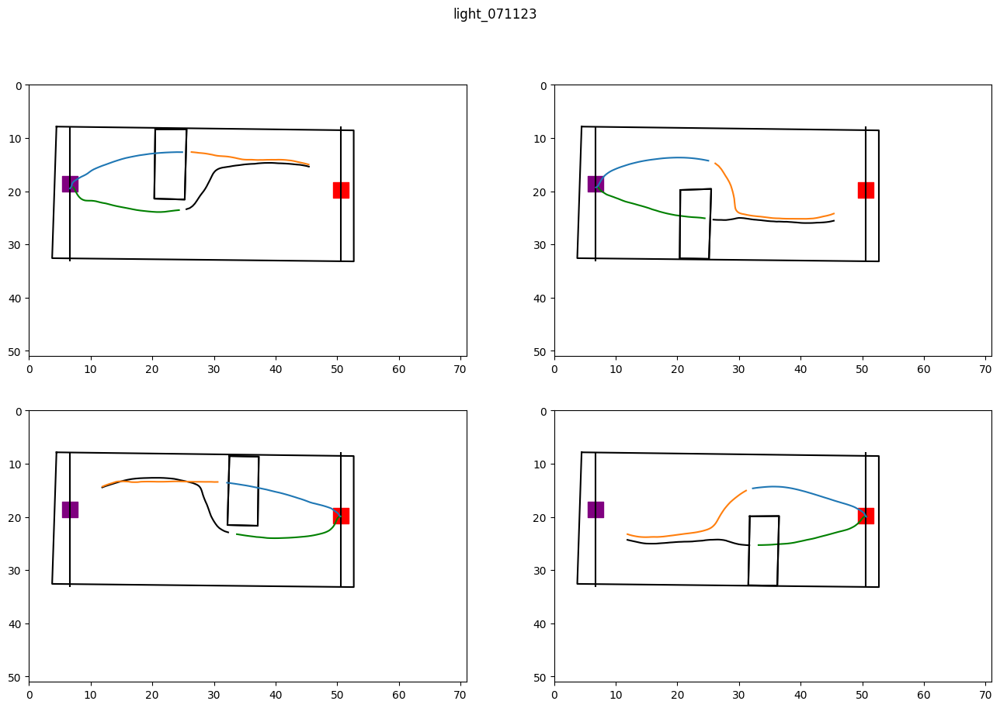

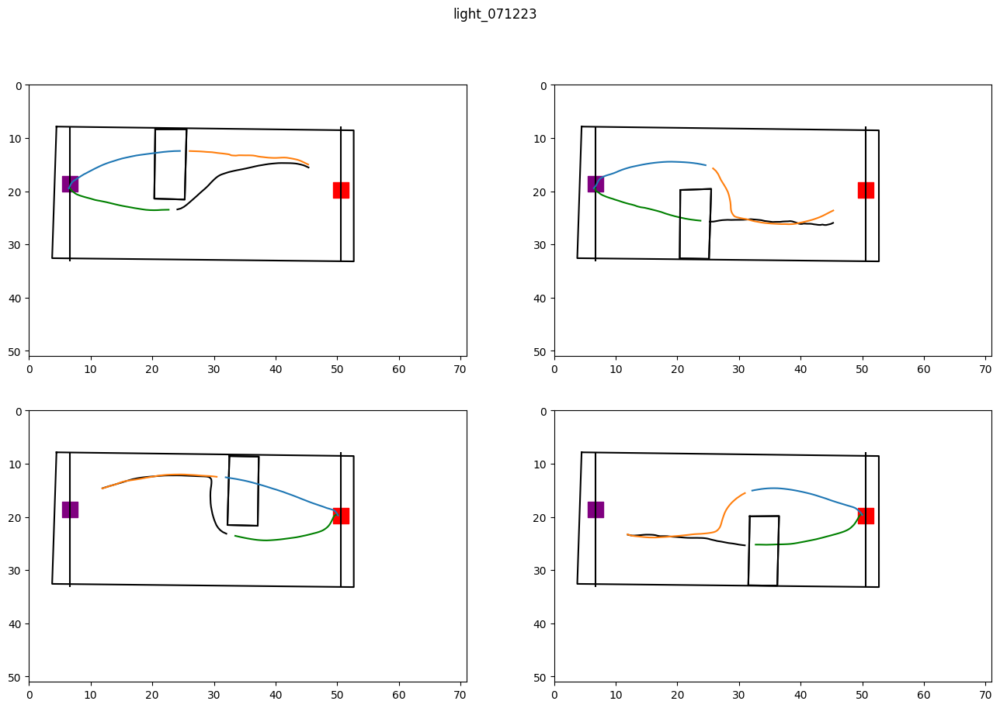

In [13]:
right = ns_dark_long
right = drop_nans_in_columns(right,'obstacle_devations')
by_date = right.groupby(['date'])
for date,date_df in by_date:

    fig,ax = plt.subplots(2,2,figsize = (16,10))

    fig.suptitle('light_' +date)
    plot_arena(right,ax[0,0])
    plot_arena(right,ax[0,1])
    plot_arena(right,ax[1,0])
    plot_arena(right,ax[1,1])
    by_start = date_df.groupby(['start'])
    for start,start_df in by_start:
        by_cluster = start_df.groupby(['obstacle_cluster'])
        for cluster,cluster_df in by_cluster:
            if cluster == 4:
                plot_obstacle(cluster_df,ax[0,1],cluster)
            if cluster == 0:
                plot_obstacle(cluster_df,ax[0,0],cluster)
            if cluster == 1:
                plot_obstacle(cluster_df,ax[1,0],cluster)
            if cluster == 5:
                plot_obstacle(cluster_df,ax[1,1],cluster)

            df = cluster_df
            if cluster == 0 and start == 'top':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[0,0].plot(ob_mean_x,ob_mean_y,color = 'black')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[0,0].plot(goal_mean_x,goal_mean_y,color = 'green')


            if cluster == 4 and start == 'top':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[0,0].plot(ob_mean_x,ob_mean_y,color = 'tab:orange')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[0,0].plot(goal_mean_x,goal_mean_y,color = 'tab:blue')


            if cluster == 4 and start == 'bottom':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[0,1].plot(ob_mean_x,ob_mean_y,color = 'tab:orange')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[0,1].plot(goal_mean_x,goal_mean_y,color = 'tab:blue')


            if cluster == 0 and start == 'bottom':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[0,1].plot(ob_mean_x,ob_mean_y,color = 'black')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[0,1].plot(goal_mean_x,goal_mean_y,color = 'green')

            if cluster == 1 and start == 'top':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[1,0].plot(ob_mean_x,ob_mean_y,color = 'black')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[1,0].plot(goal_mean_x,goal_mean_y,color = 'green')


            if cluster == 5 and start == 'top':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[1,0].plot(ob_mean_x,ob_mean_y,color = 'tab:orange')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[1,0].plot(goal_mean_x,goal_mean_y,color = 'tab:blue')

            if cluster == 1 and start == 'bottom':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[1,1].plot(ob_mean_x,ob_mean_y,color = 'black')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[1,1].plot(goal_mean_x,goal_mean_y,color = 'green')


            if cluster == 5 and start == 'bottom':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[1,1].plot(ob_mean_x,ob_mean_y,color = 'tab:orange')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[1,1].plot(goal_mean_x,goal_mean_y,color = 'tab:blue')

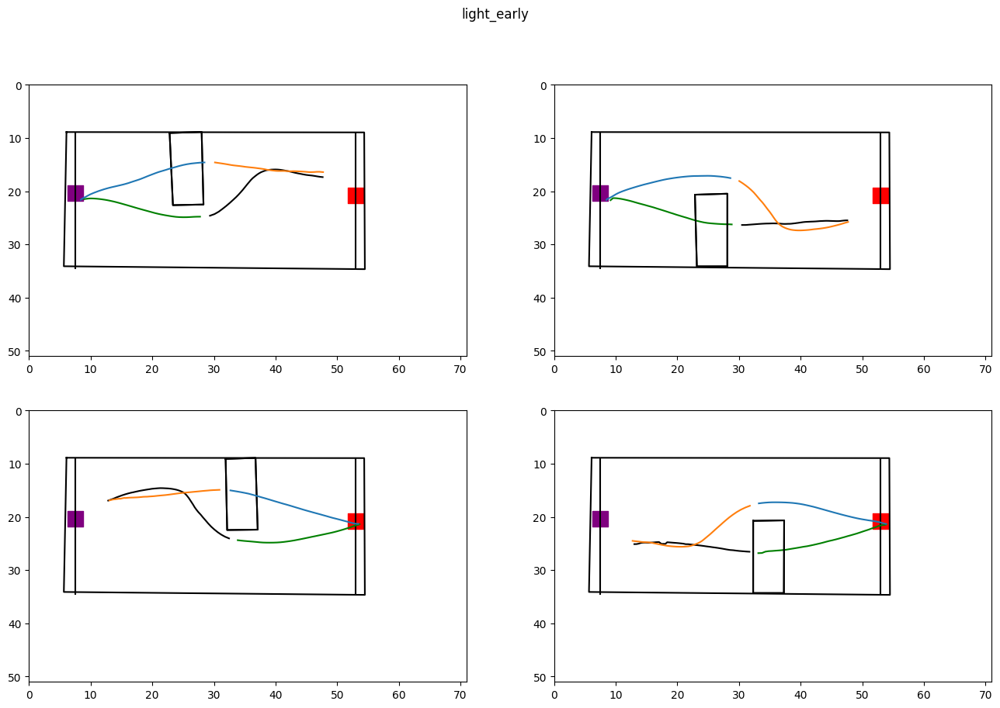

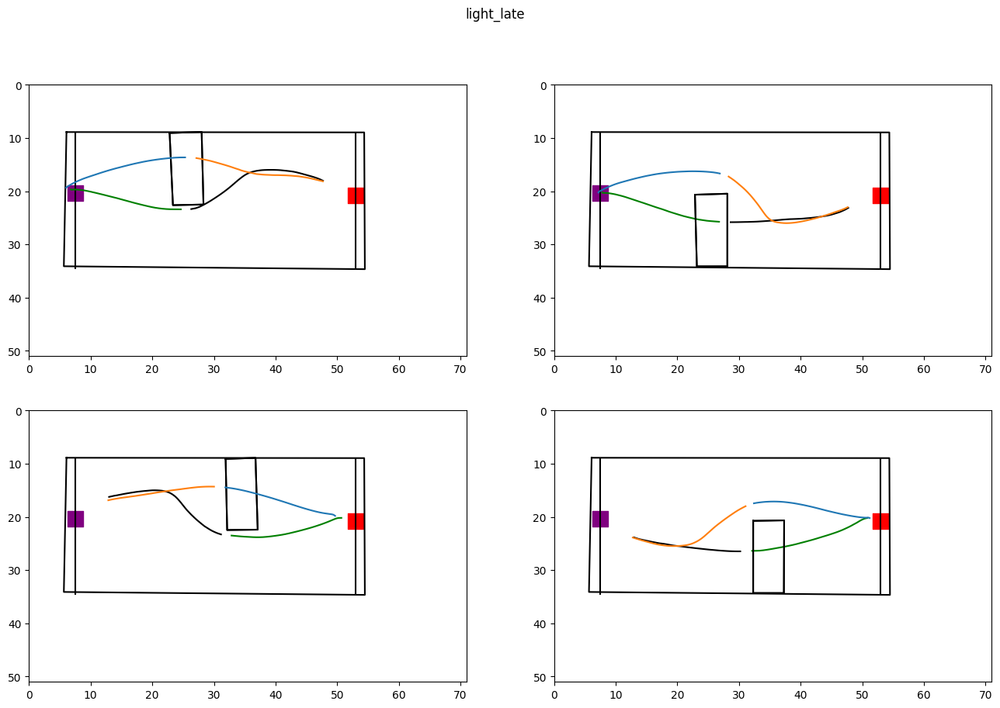

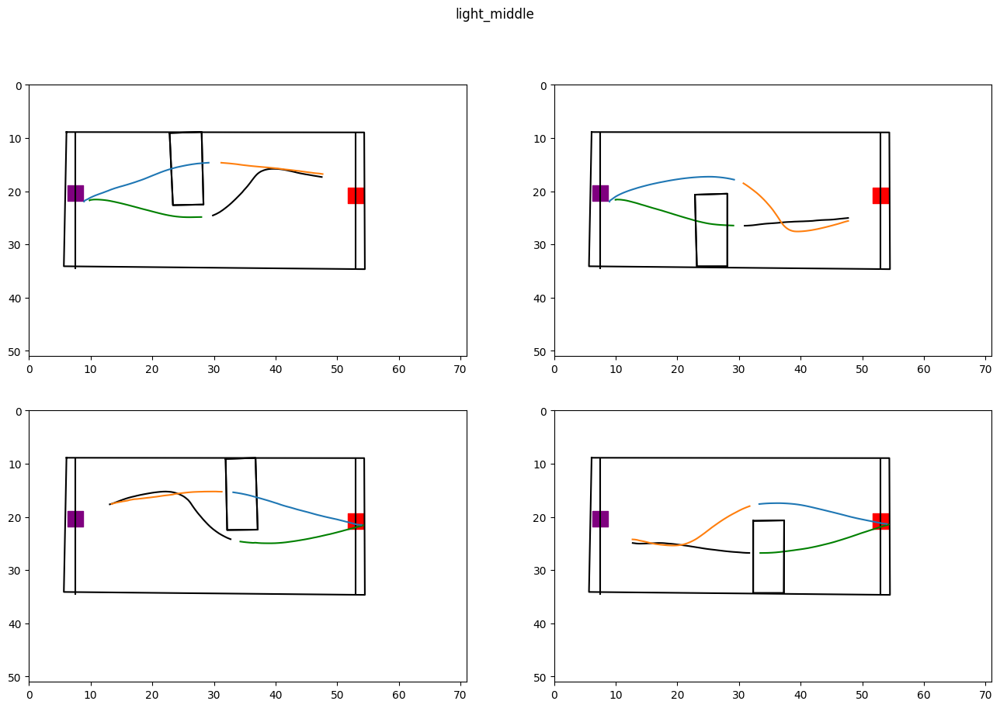

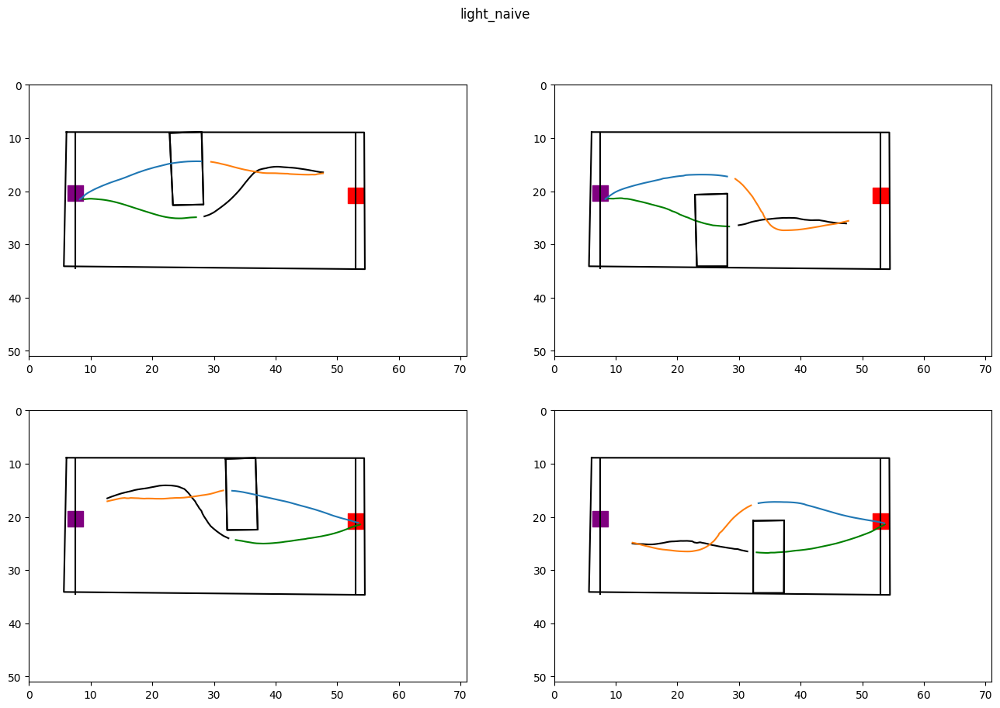

In [12]:
right = ns_oa_long
right = drop_nans_in_columns(right,'obstacle_devations')
by_date = right.groupby(['skill'])
for date,date_df in by_date:

    fig,ax = plt.subplots(2,2,figsize = (16,10))

    fig.suptitle('light_' +date)
    plot_arena(right,ax[0,0])
    plot_arena(right,ax[0,1])
    plot_arena(right,ax[1,0])
    plot_arena(right,ax[1,1])
    by_start = date_df.groupby(['start'])
    for start,start_df in by_start:
        by_cluster = start_df.groupby(['obstacle_cluster'])
        for cluster,cluster_df in by_cluster:
            if cluster == 4:
                plot_obstacle(cluster_df,ax[0,1],cluster)
            if cluster == 0:
                plot_obstacle(cluster_df,ax[0,0],cluster)
            if cluster == 1:
                plot_obstacle(cluster_df,ax[1,0],cluster)
            if cluster == 5:
                plot_obstacle(cluster_df,ax[1,1],cluster)

            df = cluster_df
            if cluster == 0 and start == 'top':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[0,0].plot(ob_mean_x,ob_mean_y,color = 'black')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[0,0].plot(goal_mean_x,goal_mean_y,color = 'green')


            if cluster == 4 and start == 'top':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[0,0].plot(ob_mean_x,ob_mean_y,color = 'tab:orange')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[0,0].plot(goal_mean_x,goal_mean_y,color = 'tab:blue')


            if cluster == 4 and start == 'bottom':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[0,1].plot(ob_mean_x,ob_mean_y,color = 'tab:orange')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[0,1].plot(goal_mean_x,goal_mean_y,color = 'tab:blue')


            if cluster == 0 and start == 'bottom':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[0,1].plot(ob_mean_x,ob_mean_y,color = 'black')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[0,1].plot(goal_mean_x,goal_mean_y,color = 'green')

            if cluster == 1 and start == 'top':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[1,0].plot(ob_mean_x,ob_mean_y,color = 'black')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[1,0].plot(goal_mean_x,goal_mean_y,color = 'green')


            if cluster == 5 and start == 'top':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[1,0].plot(ob_mean_x,ob_mean_y,color = 'tab:orange')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[1,0].plot(goal_mean_x,goal_mean_y,color = 'tab:blue')

            if cluster == 1 and start == 'bottom':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[1,1].plot(ob_mean_x,ob_mean_y,color = 'black')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[1,1].plot(goal_mean_x,goal_mean_y,color = 'green')


            if cluster == 5 and start == 'bottom':
                ob_mean_x = get_mean_of_df(df,'obstacle_nose_x',50) 
                ob_mean_y = get_mean_of_df(df,'obstacle_nose_y',50)
                ax[1,1].plot(ob_mean_x,ob_mean_y,color = 'tab:orange')

                goal_mean_x = get_mean_of_df(df,'goal_nose_x',50) 
                goal_mean_y = get_mean_of_df(df,'goal_nose_y',50)
                ax[1,1].plot(goal_mean_x,goal_mean_y,color = 'tab:blue')



           # raw = df
           # for ind,row in raw.iterrows():
           #     if cluster==4 and start=='top'  :
           #         ax[0,0].plot(row.goal_nose_x,row.goal_nose_y,color = 'tab:blue',alpha = .2)
           #         ax[0,0].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'tab:orange',alpha = .2)
           #     if cluster==4 and start=='bottom'  :
           #         ax[0,1].plot(row.goal_nose_x,row.goal_nose_y,color = 'tab:blue',alpha = .2)
           #         ax[0,1].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'tab:orange',alpha = .2)
           #     if cluster==0 and start=='bottom'  :
           #         ax[0,1].plot(row.goal_nose_x,row.goal_nose_y,color = 'green',alpha = .2)
           #         ax[0,1].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'black',alpha = .2)
           #     if cluster==0 and start=='top'  :
           #         ax[0,0].plot(row.goal_nose_x,row.goal_nose_y,color = 'green',alpha = .2)
           #         ax[0,0].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'black',alpha = .2)
           #     if cluster==1 and start=='bottom'  :
           #         ax[1,1].plot(row.goal_nose_x,row.goal_nose_y,color = 'green',alpha = .2)
           #         ax[1,1].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'black',alpha = .2)
           #     if cluster==1 and start=='top'  :
           #         ax[1,0].plot(row.goal_nose_x,row.goal_nose_y,color = 'green',alpha = .2)
           #         ax[1,0].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'black',alpha = .2)
           #     if cluster==5 and start=='bottom'  :
           #         ax[1,1].plot(row.goal_nose_x,row.goal_nose_y,color = 'tab:blue',alpha = .2)
           #         ax[1,1].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'tab:orange',alpha = .2)
           #     if cluster==5 and start=='top'  :
           #         ax[1,0].plot(row.goal_nose_x,row.goal_nose_y,color = 'tab:blue',alpha = .2)
           #         ax[1,0].plot(row.obstacle_nose_x,row.obstacle_nose_y,color = 'tab:orange',alpha = .2)